In [418]:
# %pip install torch pandas numpy matplotlib seaborn scipy scikit-learn

In [419]:
import torch
import os

""" 
  Check if GPU is available and set the device accordingly
  If GPU is available, use it; otherwise, use CPU
  This is important for performance, especially for deep learning tasks
"""

# Configure GPU setting for optimal performance
if torch.cuda.is_available():
  print(f"CUDA available: {torch.cuda.is_available()}")
  print(f"GPU count: {torch.cuda.device_count()}")
  print(f"GPU name: {torch.cuda.get_device_name(0)}")

  # Set CUDE device
  os.environ["CUDA_VISIBLE_DEVICES"] = "0"  # Use first GPU

  # Enable CUDE OPtimization
  torch.backends.cudnn.benchmark = True

  # Print GPU info
  gpu_info = !nvidia-smi
  gpu_info = '\n'.join(gpu_info)
  if gpu_info.find('failed') >= 0:
    print('Not connected to a GPU')
  else:
      print(gpu_info)
else:
  # Configure CPU
  num_cpu_cores = os.cpu_count()
  print(f"Number of CPU cores available: {num_cpu_cores}")
  print(f"Number of CPU cores using: {num_cpu_cores-1}")

  # Use slightly fewer than max cores to leave resources for the OS
  torch.set_num_threads(num_cpu_cores - 1)

  # For even more control, set OpenMP threads
  os.environ["OMP_NUM_THREADS"] = str(num_cpu_cores - 1)
  os.environ["MKL_NUM_THREADS"] = str(num_cpu_cores - 1)

Number of CPU cores available: 8
Number of CPU cores using: 7


In [420]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [421]:
# Load the required csv files
genetics_csv_file_path = "../data/APOE_GENETIC_29Oct2024.csv"                   # For APVOLUME
upenbiomk_csv_file_path = "../data/UPENNBIOMK_ROCHE_ELECSYS_29Oct2024.csv"      # For ABETA42, TAU and PTAU
fugi_abeta_path = "../data/FUJIREBIOABETA_05Nov2024.csv"                        # For ABETA42, ABETA42/40
ugotptau181_csv_file_path = "../data/UGOTPTAU181_06_18_20_29Oct2024.csv"        # For PLASMAPTAU181
blenn_cfl_nfl_path = "../data/BLENNOWCSFNFL_05Nov2024.csv"                      # For CSF Nfl
ucsffsx6_csv_file_path = "../data/UCSFFSX6_07_06_23_29Oct2024.csv"              # For Cortical thickness in certain temporal region
ucsffsl51_csv_file_path = "../data/UCSFFSL51_03_01_22_29Oct2024.csv"            # For Cortical thickness in ceratin temporal region
ptdemog_csv_file_path = "../data/PTDEMOG_29Oct2024.csv"                         # For Patient gender and DOB
medhist_csv_file_path = "../data/MEDHIST_29Oct2024.csv"                         # For medical history of patient


# Selected columns
genetics_selected_columns = [
    "RID",
    "VISDATE",
    "APVOLUME"
]
upenbiomk_selected_columns = [
    "RID",
    "EXAMDATE",
    "ABETA42",
    "TAU",
    "PTAU"
]
fugi_abeta_columns = [
    "RID",
    "EXAMDATE",
    "ABETA42_40",
    "ABETA42",
    # "ABETA40"
]
ugotptau181_selected_columns = [
    "RID",
    "EXAMDATE",
    "PLASMAPTAU181"
]
blenn_cfl_nfl_columns = [
    "RID",
    "EXAMDATE",
    "CSFNFL"
]
ucsffsx6_selected_columns = [
    "RID",
    "EXAMDATE",
    "ST58TA",  # Cortical Thickness Average of Left Superior Temporal
    "ST117TA", # Cortical Thickness Average of Right Superior Temporal
    "ST40TA",  # Cortical Thickness Average of Left Middle Temporal
    "ST99TA",  # Cortical Thickness Average of Right Middle Temporal
    "ST32TA",  # Cortical Thickness Average of Left Inferior Temporal
    "ST91TA",  # Cortical Thickness Average of Right Inferior Temporal
    "ST60TA",  # Cortical Thickness Average of Left Temporal Pole
    "ST119TA", # Cortical Thickness Average of Right Temporal Pole
    "ST62TA",  # Cortical Thickness Average of Left Transverse Temporal
    "ST121TA"  # Cortical Thickness Average of Right Transverse Temporal
]
ucsffsl51_selected_columns = [
    "RID",
    "EXAMDATE",
    "ST58TA",  # Cortical Thickness Average of Left Superior Temporal
    "ST117TA", # Cortical Thickness Average of Right Superior Temporal
    "ST40TA",  # Cortical Thickness Average of Left Middle Temporal
    "ST99TA",  # Cortical Thickness Average of Right Middle Temporal
    "ST32TA",  # Cortical Thickness Average of Left Inferior Temporal
    "ST91TA",  # Cortical Thickness Average of Right Inferior Temporal
    "ST60TA",  # Cortical Thickness Average of Left Temporal Pole
    "ST119TA", # Cortical Thickness Average of Right Temporal Pole
    "ST62TA",  # Cortical Thickness Average of Left Transverse Temporal
    "ST121TA"  # Cortical Thickness Average of Right Transverse Temporal
]
ptdemog_selected_columns = [
    "RID",
    "VISDATE",
    "PTGENDER",
    "PTDOB"
]
medhist_selected_columns = [
    "RID",
    "VISDATE",
    "MH14ALCH",  # Alcohol Abuse
    "MH15DRUG",  # Drug Abuse
    "MH16SMOK",  # Smoking
    "MH2NEURL",  # Neurologic (other than AD)
    "MHPSYCH"   # Psychiatric Conditions
]

names = {
    "ST58TA":   "Cortical Thickness Average of Left Superior Temporal",
    "ST117TA":  "Cortical Thickness Average of Right Superior Temporal",
    "ST40TA":   "Cortical Thickness Average of Left Middle Temporal",
    "ST99TA":   "Cortical Thickness Average of Right Middle Temporal",
    "ST32TA":   "Cortical Thickness Average of Left Inferior Temporal",
    "ST91TA":   "Cortical Thickness Average of Right Inferior Temporal",
    "ST60TA":   "Cortical Thickness Average of Left Temporal Pole",
    "ST119TA":  "Cortical Thickness Average of Right Temporal Pole",
    "ST62TA":   "Cortical Thickness Average of Left Transverse Temporal",
    "ST121TA" :  "Cortical Thickness Average of Right Transverse Temporal"
}

pd.set_option('display.max_columns', None)

genetics_df = pd.read_csv(genetics_csv_file_path, usecols=genetics_selected_columns)
upenbiomk_df = pd.read_csv(upenbiomk_csv_file_path, usecols=upenbiomk_selected_columns)
fugi_abeta_df = pd.read_csv(fugi_abeta_path, usecols= fugi_abeta_columns)
ugotptau181_df = pd.read_csv(ugotptau181_csv_file_path, usecols=ugotptau181_selected_columns)
blenn_cfl_nfl_df = pd.read_csv(blenn_cfl_nfl_path, usecols= blenn_cfl_nfl_columns)
ucsffsx6_df = pd.read_csv(ucsffsx6_csv_file_path, usecols=ucsffsx6_selected_columns)
ucsffsl51_df = pd.read_csv(ucsffsl51_csv_file_path, usecols=ucsffsl51_selected_columns)
ptdemog_df = pd.read_csv(ptdemog_csv_file_path, usecols=ptdemog_selected_columns)
medhist_df = pd.read_csv(medhist_csv_file_path, usecols=medhist_selected_columns)

dfs = [genetics_df, upenbiomk_df, fugi_abeta_df, blenn_cfl_nfl_df, ugotptau181_df, ucsffsl51_df, ucsffsx6_df, ptdemog_df, medhist_df]

print(f"genetics unique RIDs: {genetics_df['RID'].nunique()} len: {len(genetics_df)}")
print(f"upenbiomk unique RIDs: {upenbiomk_df['RID'].nunique()} len: {len(upenbiomk_df)}")
print(f"fugi_abeta unique RIDs: {fugi_abeta_df['RID'].nunique()} len: {len(fugi_abeta_df)}")
print(f"ugotptau181 unique RIDs: {ugotptau181_df['RID'].nunique()} len: {len(ugotptau181_df)}")
print(f"blenn_cfl_nfl unique RIDs: {blenn_cfl_nfl_df['RID'].nunique()} len: {len(blenn_cfl_nfl_df)}")
print(f"ucsffsx6 unique RIDs: {ucsffsx6_df['RID'].nunique()} len: {len(ucsffsx6_df)}")
print(f"ucsffsl51 unique RIDs: {ucsffsl51_df['RID'].nunique()} len: {len(ucsffsl51_df)}")
print(f"ptdemog unique RIDs: {ptdemog_df['RID'].nunique()} len: {len(ptdemog_df)}")
print(f"medhist unique RIDs: {medhist_df['RID'].nunique()} len: {len(medhist_df)}")

genetics unique RIDs: 2719 len: 8302
upenbiomk unique RIDs: 1660 len: 3174
fugi_abeta unique RIDs: 423 len: 442
ugotptau181 unique RIDs: 1191 len: 3758
blenn_cfl_nfl unique RIDs: 399 len: 415
ucsffsx6 unique RIDs: 1079 len: 2091
ucsffsl51 unique RIDs: 689 len: 3311
ptdemog unique RIDs: 4379 len: 5441
medhist unique RIDs: 2491 len: 3083


In [422]:
print(genetics_df.head())       # Uses VISDATE as date
print(ugotptau181_df.head())    # Uses EXAMDATE as date

   RID     VISDATE  APVOLUME
0    2  2005-08-17      10.0
1    3  2005-08-18      10.0
2    4  2005-08-18       8.0
3    5  2005-08-23      10.0
4    7  2005-08-25       9.0
   RID    EXAMDATE  PLASMAPTAU181
0    2  2010-09-22         11.939
1    2  2011-09-19         12.936
2    2  2012-09-26         13.563
3    2  2013-09-09         15.506
4    8  2010-09-27         18.305


In [423]:
# Convert the column name from VISADATE TO EXAMDATE, as they mean the same
for df in dfs:
    if "VISDATE" in df.columns:
        df.rename(columns={"VISDATE":"EXAMDATE"}, inplace=True)
        print(df.columns)

Index(['RID', 'EXAMDATE', 'APVOLUME'], dtype='object')
Index(['RID', 'EXAMDATE', 'PTGENDER', 'PTDOB'], dtype='object')
Index(['RID', 'EXAMDATE', 'MHPSYCH', 'MH2NEURL', 'MH14ALCH', 'MH15DRUG',
       'MH16SMOK'],
      dtype='object')


In [424]:
# There are data where for a patient, there are two values of APVOLUME on the same EXAMDATE. And one of them is -4
# -4 is the Missing data code used by ADNI
for df in dfs:
    for columns in df.columns:
        if columns not in ["RID", "EXAMDATE"]:
            duplicates = (
                df.groupby(["RID", "EXAMDATE"])
                .filter(lambda x: len(x)> 1 and x[columns].nunique()>1)
            )
            if len(duplicates[duplicates[columns] == -4]) > 0:
                print(f"There are {len(duplicates[duplicates[columns] == -4])} patients that have -4 {columns} value and an other value on the same exam date")

There are 22 patients that have -4 APVOLUME value and an other value on the same exam date


In [425]:
# Dropping -4 values when they are present on the same day as the actual APVOLUME of the patient
duplicates = (
    genetics_df.groupby(["RID", "EXAMDATE"])
    .filter(lambda x: len(x)> 1 and x["APVOLUME"].nunique()>1)
)
genetics_df = genetics_df.drop(duplicates[duplicates["APVOLUME"] == -4].index)
print(f"genetics RID: {genetics_df['RID'].nunique()} len: {len(genetics_df)}")

genetics RID: 2719 len: 8280


In [426]:
# There are 2 different values for ABETA42 for RID 42 on 2011-04-14
# There are many more examples like these
print("upenbiomk_df")
print(upenbiomk_df[upenbiomk_df["RID"] == 42])
print("\nfugi_abeta_df")
print(fugi_abeta_df[fugi_abeta_df["RID"] == 42])

upenbiomk_df
    RID    EXAMDATE  ABETA42    TAU   PTAU
38   42  2005-11-10   1258.0  250.1  18.23
39   42  2006-11-09    766.5  205.4  18.40
40   42  2008-08-18   1224.0  208.7  18.44
41   42  2010-03-18   1011.0  211.5  18.10
42   42  2011-04-14   1483.0  238.8  19.56
43   42  2013-01-24   1139.0  218.4  17.69

fugi_abeta_df
   RID    EXAMDATE  ABETA42  ABETA42_40
0   42  2011-04-14     1022       0.098


In [427]:
def merge_features_with_suffixes(df, feature, suffix_1, suffix_2) -> None:
    """
    Merge two columns in a Dataframe that represent the same feature with different suffixes.

    For rows where at least one of the columns has a non-NaN value, calculate the mean
    of the two columns and assign it to a new column named after the feature. The original
    columns are dropped after the merge.

    Args:
        df (pd.DataFrame): The DataFrame containing the columns to merge.
        feature (str): The name of the feature column to merge and create.
        suffix_1 (str): The suffix of the first column to merge.
        suffix_2 (str): The suffix of the second column to merge.
    """

    # Identify rows where atleast one column has a non-NaN value
    valid_rows = ~df[[feature + suffix_1, feature + suffix_2]].isna().all(axis=1)

    # Calculate the mean for valid rows and assign it to the new feature column
    df.loc[valid_rows, feature] = np.nanmean(
        df.loc[valid_rows, [feature + suffix_1, feature + suffix_2]].to_numpy(), axis=1
    )

    # Drop the original columns with suffixes
    df.drop(columns=[feature + suffix_1, feature + suffix_2], inplace=True)

In [428]:
# Merge UPENN(Uni of Pennsylvania) and Fuji(Fujirebio) dataset
merged_upen_fuji = pd.merge(upenbiomk_df, fugi_abeta_df, on=["RID", "EXAMDATE"], suffixes=["_UPENN", "_FUJI"], how="outer")

In [429]:
merge_features_with_suffixes(merged_upen_fuji, "ABETA42", "_UPENN", "_FUJI")

In [430]:
merged_upen_fuji[merged_upen_fuji["RID"] == 42]

,RID,EXAMDATE,TAU,PTAU,ABETA42_40,ABETA42
38,42,2005-11-10,250.1,18.23,NaN,1258.0
39,42,2006-11-09,205.4,18.40,NaN,766.5
40,42,2008-08-18,208.7,18.44,NaN,1224.0
41,42,2010-03-18,211.5,18.10,NaN,1011.0
42,42,2011-04-14,238.8,19.56,0.098,1252.5
43,42,2013-01-24,218.4,17.69,NaN,1139.0


In [431]:
merged_uscffsx6_uscffsl51 = pd.merge(ucsffsx6_df, ucsffsl51_df, on=["RID", "EXAMDATE"], suffixes=["_UCSFFSX6", "_UCSFFSL51"], how="outer")

In [432]:
# Get the Independent variables (cortical thickness features)
feature_pairs = [
    col.split("_UCSFFSX6")[0]
    for col in merged_uscffsx6_uscffsl51.columns
    if col.endswith("_UCSFFSX6")
]

In [433]:
for feature in feature_pairs:
    merge_features_with_suffixes(merged_uscffsx6_uscffsl51, feature, "_UCSFFSX6", "_UCSFFSL51")

In [434]:
# Remove the UPENN(Uni of Pennsylvania) and Fuji(Fujirebio) dataset from the list of datasets
dfs_to_remove = [upenbiomk_df, fugi_abeta_df, ucsffsx6_df, ucsffsl51_df]
dfs = [df for df in dfs if not any(df.equals(remove_df) for remove_df in dfs_to_remove)]

In [435]:
# Add the merged dataset of UPENN(Uni of Pennsylvania) and Fuji(Fujirebio) to the list of datasets
# Add the merged dataset of UCSFFSX6 and UCSFFSL51 to the list of datasets
df_to_add = [merged_upen_fuji, merged_uscffsx6_uscffsl51]
dfs.extend(df_to_add)

In [436]:
# Patient 4680 had EXAMDATE within 6 months 2012-05-14 and 2012-10-29
# There are many more examples like these
print(ugotptau181_df[ugotptau181_df["RID"] == 4680])

       RID    EXAMDATE  PLASMAPTAU181
2955  4680  2012-05-14         13.169
2956  4680  2012-10-29         19.501
2957  4680  2014-04-16         18.368


In [437]:
def filter_patients_within_six_months(group):
    # Ensure EXAMDATE is in datetime format
    group["EXAMDATE"] = pd.to_datetime(group["EXAMDATE"] , errors='coerce')

    # Sort by EXAMDATE
    group.sort_values(by="EXAMDATE", ascending=True, inplace=True)

    # List containing the rows that are atleast 6 months apart for each patient
    filtered_rows = []

    for _, row in group.iterrows():
        # Check if 'filtered_rows' is empty or if the difference in EXAMDATE is atleast 6 months
        if not filtered_rows or row["EXAMDATE"] >= filtered_rows[-1]["EXAMDATE"] + pd.DateOffset(months=6):
            filtered_rows.append(row)

    return pd.DataFrame(filtered_rows)

for df in dfs:
    columns_needed = df.columns  
    df = df.groupby("RID")[columns_needed].apply(filter_patients_within_six_months).reset_index(drop=True)

In [438]:
merged_uscffsx6_uscffsl51_columns_needed = merged_uscffsx6_uscffsl51.columns
merged_uscffsx6_uscffsl51 = merged_uscffsx6_uscffsl51.groupby("RID")[merged_uscffsx6_uscffsl51_columns_needed].apply(filter_patients_within_six_months, include_groups=True).reset_index(drop=True)
merged_uscffsx6_uscffsl51.shape

(4444, 12)

In [439]:
merged_uscffsx6_uscffsl51.drop(columns=["EXAMDATE"], inplace=True)
merged_uscffsx6_uscffsl51.drop(columns=["RID"], inplace=True)

In [440]:
from functools import reduce

merged_df = reduce(lambda left, right: pd.merge(left, right, on=["RID", "EXAMDATE"], how='outer'), dfs)
len(merged_df)

18374

In [441]:
merged_df.head()

,RID,EXAMDATE,APVOLUME,CSFNFL,PLASMAPTAU181,PTGENDER,PTDOB,MHPSYCH,MH2NEURL,MH14ALCH,MH15DRUG,MH16SMOK,TAU,PTAU,ABETA42_40,ABETA42,ST117TA,ST119TA,ST121TA,ST32TA,ST40TA,ST58TA,ST60TA,ST62TA,ST91TA,ST99TA
0,1,2005-08-18,NaN,NaN,NaN,2.0,12/1944,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,2005-08-17,10.0,NaN,NaN,1.0,04/1931,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,2010-09-22,10.0,NaN,11.939,1.0,04/1931,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2,2011-09-19,10.0,NaN,12.936,1.0,04/1931,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2,2012-09-26,-4.0,NaN,13.563,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [442]:
merged_df.describe()

,RID,APVOLUME,CSFNFL,PLASMAPTAU181,PTGENDER,MHPSYCH,MH2NEURL,MH14ALCH,MH15DRUG,MH16SMOK,TAU,PTAU,ABETA42_40,ABETA42,ST117TA,ST119TA,ST121TA,ST32TA,ST40TA,ST58TA,ST60TA,ST62TA,ST91TA,ST99TA
count,18374.000000,6793.000000,415.000000,3819.000000,5345.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3183.000000,3171.000000,446.000000,3212.000000,5274.000000,5274.000000,5401.000000,5274.000000,5274.000000,5274.000000,5274.000000,5401.000000,5274.000000,5274.000000
mean,4991.931806,1.343530,1465.816867,18.961121,1.426006,0.348801,0.314394,0.043876,0.009470,0.398043,286.860669,27.284298,0.065126,1037.306336,2.603308,3.539679,2.205641,2.747031,2.747196,2.584277,3.499641,2.182573,2.782660,2.791021
std,32929.128764,6.294902,1020.097069,14.719812,0.751369,0.476666,0.464347,0.204852,0.096866,0.489572,128.434802,14.273994,0.044928,607.681723,0.206476,0.495152,0.272779,0.230834,0.215853,0.220439,0.439525,0.259656,0.223658,0.201916
min,1.000000,-4.000000,405.000000,0.362000,-4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,80.080000,8.000000,0.022000,203.000000,1.456000,1.238000,1.252000,1.613000,1.579000,1.575000,1.341000,1.246000,1.575000,1.626000
25%,2010.000000,-4.000000,967.500000,11.105000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,195.700000,17.170000,0.041250,580.150000,2.479000,3.323250,2.028000,2.618000,2.642000,2.456000,3.290000,2.020000,2.664250,2.688000
50%,4395.000000,-4.000000,1250.000000,16.343000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,257.000000,23.540000,0.055000,847.450000,2.616000,3.631000,2.217000,2.771500,2.774000,2.599000,3.566500,2.194000,2.807000,2.805000
75%,5198.000000,9.000000,1644.000000,23.516500,2.000000,1.000000,1.000000,0.000000,0.000000,1.000000,344.700000,33.485000,0.089750,1389.875000,2.743750,3.868000,2.392000,2.900000,2.892000,2.738000,3.790750,2.358000,2.933000,2.922000
max,999999.000000,10.000000,12647.000000,451.398000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1018.000000,108.500000,0.827000,4779.000000,3.287000,4.717000,3.159000,3.449000,3.294000,3.256000,4.684000,3.137000,3.420000,3.409000


In [443]:
merged_df["RID"].nunique()

4382

In [444]:
dependent_variables = ["ABETA42","ABETA42_40", "APVOLUME","TAU", "PTAU", "PLASMAPTAU181", "CSFNFL", "PTGENDER", "PTDOB", "MH14ALCH", "MH15DRUG", "MH16SMOK", "MH2NEURL", "MHPSYCH"]

# Define target variable names
target_names = [
    "ST58TA",  # Cortical Thickness Average of Left Superior Temporal
    "ST117TA", # Cortical Thickness Average of Right Superior Temporal
    "ST40TA",  # Cortical Thickness Average of Left Middle Temporal
    "ST99TA",  # Cortical Thickness Average of Right Middle Temporal
    "ST32TA",  # Cortical Thickness Average of Left Inferior Temporal
    "ST91TA",  # Cortical Thickness Average of Right Inferior Temporal
    "ST60TA",  # Cortical Thickness Average of Left Temporal Pole
    "ST119TA", # Cortical Thickness Average of Right Temporal Pole
    "ST62TA",  # Cortical Thickness Average of Left Transverse Temporal
    "ST121TA"  # Cortical Thickness Average of Right Transverse Temporal
]

non_na_count = {}

for variable in dependent_variables:
    non_na_target_counts = merged_df[~merged_df[variable].isna()][target_names].notna().sum()
    non_na_count[variable] = non_na_target_counts

result_df = pd.DataFrame(non_na_count)
print(f"The number of non-NaN values in the dependent variables and target variables are as follows:\n")
print(result_df)

The number of non-NaN values in the dependent variables and target variables are as follows:

         ABETA42  ABETA42_40  APVOLUME  TAU  PTAU  PLASMAPTAU181  CSFNFL  \
ST58TA        89           0      1292   89    89            733       0   
ST117TA       89           0      1292   89    89            733       0   
ST40TA        89           0      1292   89    89            733       0   
ST99TA        89           0      1292   89    89            733       0   
ST32TA        89           0      1292   89    89            733       0   
ST91TA        89           0      1292   89    89            733       0   
ST60TA        89           0      1292   89    89            733       0   
ST119TA       89           0      1292   89    89            733       0   
ST62TA        94           0      1293   94    94            733       0   
ST121TA       94           0      1293   94    94            733       0   

         PTGENDER  PTDOB  MH14ALCH  MH15DRUG  MH16SMOK  MH2NEURL  MHP

In [445]:
dependent_variable_minus_four_count = {}

for variable in dependent_variables:
    dependent_variable_minus_four_count[variable] = (
        merged_df[merged_df[variable].notna() &
        merged_df[target_names].notna().all(axis=1)][variable] == -4
    ).sum()

print(f"The number of -4 values in the dependent variables where all the target variables are non-NaN are as follows:\n")
print(pd.DataFrame(dependent_variable_minus_four_count, index=[0]))
print(f"\nTherefore we got to remove the data points where the dependent variables have -4 values as they are code for missing data")

The number of -4 values in the dependent variables where all the target variables are non-NaN are as follows:

   ABETA42  ABETA42_40  APVOLUME  TAU  PTAU  PLASMAPTAU181  CSFNFL  PTGENDER  \
0        0           0      1256    0     0              0       0         0   

   PTDOB  MH14ALCH  MH15DRUG  MH16SMOK  MH2NEURL  MHPSYCH  
0      0         0         0         0         0        0  

Therefore we got to remove the data points where the dependent variables have -4 values as they are code for missing data


In [446]:
cardinality_info = {}

for variable in dependent_variables:
    # Get unique values excluding NaN
    unique_values = merged_df[variable].dropna().unique()
    
    # Remove -4 (missing value code) from consideration
    non_missing_values = unique_values[unique_values != -4]
    
    # Store the count and values based on cardinality
    if len(non_missing_values) <= 2:
        cardinality_info[variable] = f"{len(non_missing_values)} unique values: {sorted(non_missing_values)}"
    else:
        cardinality_info[variable] = f"{len(non_missing_values)} unique values"
# Display the results
for var, info in cardinality_info.items():
    print(f"{var}: {info}")

ABETA42: 2606 unique values
ABETA42_40: 84 unique values
APVOLUME: 23 unique values
TAU: 2149 unique values
PTAU: 2166 unique values
PLASMAPTAU181: 3551 unique values
CSFNFL: 358 unique values
PTGENDER: 2 unique values: [1.0, 2.0]
PTDOB: 581 unique values
MH14ALCH: 2 unique values: [0.0, 1.0]
MH15DRUG: 2 unique values: [0.0, 1.0]
MH16SMOK: 2 unique values: [0.0, 1.0]
MH2NEURL: 2 unique values: [0.0, 1.0]
MHPSYCH: 2 unique values: [0.0, 1.0]


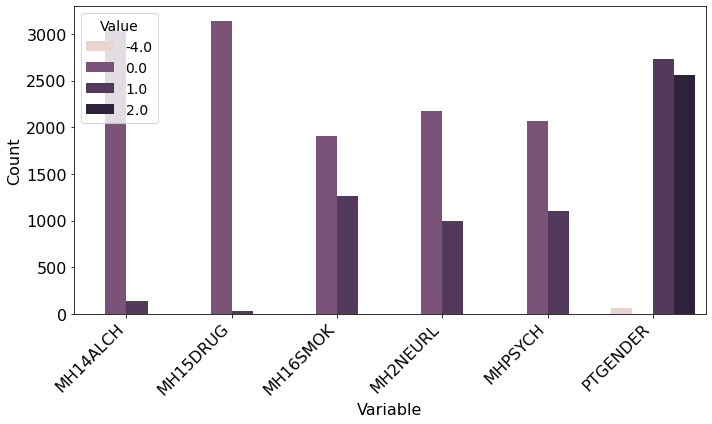

In [447]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up the figure for just one plot
fig, ax1 = plt.subplots(figsize=(10, 6))

# Panel 1: Bar plots for binary variables
binary_vars = ['MH14ALCH', 'MH15DRUG', 'MH16SMOK', 'MH2NEURL', 'MHPSYCH', 'PTGENDER']
binary_data = pd.melt(merged_df[binary_vars], var_name='Variable', value_name='Value')
sns.countplot(data=binary_data, x='Variable', hue='Value', ax=ax1)
ax1.set_ylabel('Count', fontsize=16)
ax1.set_xlabel('Variable', fontsize=16)

# Rotate the labels directly with plt.xticks
plt.xticks(rotation=45, ha='right', fontsize=16)
plt.yticks(fontsize=16)

# Add legend with better formatting
legend = ax1.legend(title="Value", fontsize=14)
legend.get_title().set_fontsize(14)

plt.tight_layout()
plt.savefig('binary_variables_distribution.png', dpi=300)
plt.show()

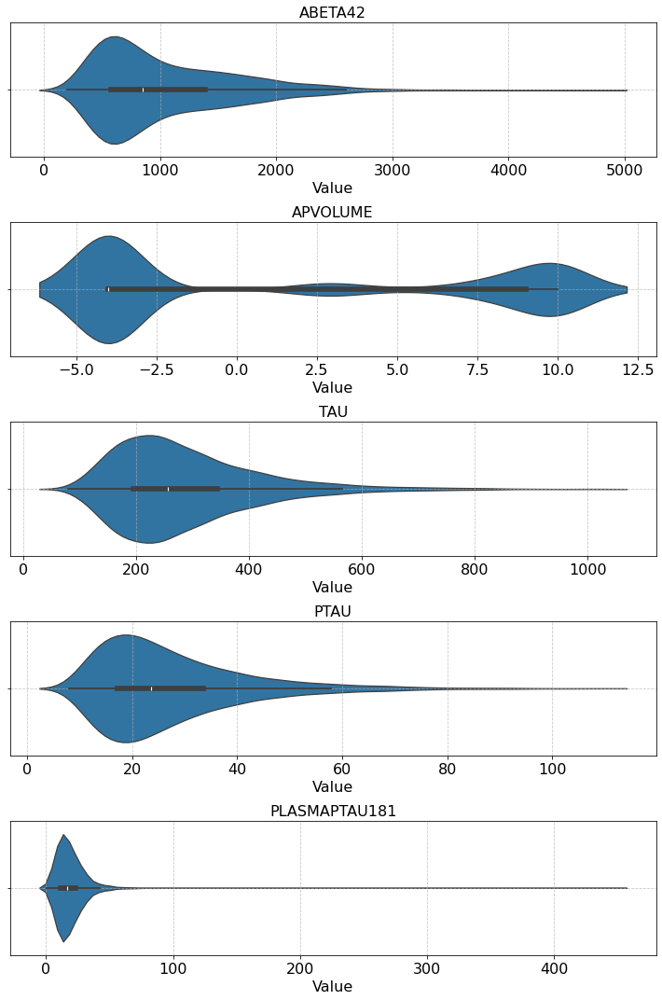

In [448]:
# Create vertical stacked horizontal violin plots
fig, axes = plt.subplots(5, 1, figsize=(10, 15))
continuous_vars = ['ABETA42', 'APVOLUME', 'TAU', 'PTAU', 'PLASMAPTAU181']

for i, var in enumerate(continuous_vars):
    sns.violinplot(data=merged_df, x=var, ax=axes[i], orient='h')
    axes[i].set_title(var, fontsize=16)
    axes[i].set_xlabel('Value', fontsize=16)
    
    # Make tick labels bigger
    axes[i].tick_params(axis='x', labelsize=16)  # Increase x-tick font size
    
    # Add grid lines for better readability
    axes[i].grid(True, linestyle='--', alpha=0.7)
    
plt.tight_layout()
plt.savefig('continuous_variables_violin_plots.png', dpi=300)
plt.show()

In [449]:
def filter_dataframe(variable) -> pd.DataFrame:
    """
    Filter the dataframe to keep only rows that meet the following conditions:
    Condition 1: The value in the variable column must NOT be NaN
    Condition 2: The value in the variable column must NOT be -4
    Condition 3: All values in the target_names columns for a row must NOT be NaN

    This ensures that we do not have NaN values and -4 values in the dependent variable column,

    Parameters:
        variable (str): The name of the dependent variable column

    Returns:
        pd.DataFrame: The filtered DataFrame containing only rows where both the variable and target_names columns are not NaN
    """

    new_df =  merged_df[
        (~merged_df[variable].isna()) &                       # Dependent variable column must NOT be NaN
        (merged_df[variable] != -4) &                         # Dependent variable column must NOT be -4
        (merged_df[target_names].notna().all(axis=1))         # All target columns must NOT be NaN
    ]

    # Extract the variable and target_names columns from the filtered DataFrame
    df = pd.DataFrame({
        variable: new_df[variable],
    })
    for i in range(len(target_names)):
        df[target_names[i]] = new_df[target_names[i]]
    return df

# Alternative for Condition 3: ~merged_df[target_names].isna().any(axis=1)
# The former is more direct and readable

In [450]:
sample_sizees = {}
for variable in dependent_variables:
    sample_sizees[variable] = len(filter_dataframe(variable))
print(f"The sample sizes for each dependent variable are as follows:\n")
print(pd.DataFrame(sample_sizees, index=[0]))

The sample sizes for each dependent variable are as follows:

   ABETA42  ABETA42_40  APVOLUME  TAU  PTAU  PLASMAPTAU181  CSFNFL  PTGENDER  \
0       89           0        36   89    89            733       0       167   

   PTDOB  MH14ALCH  MH15DRUG  MH16SMOK  MH2NEURL  MHPSYCH  
0    167        74        74        74        74       74  


In [451]:
remove_dependent_variables = ["ABETA42_40", "CSFNFL"]

has_only_zeros_and_ones = ["MH14ALCH", "MH15DRUG", "MH16SMOK", "MH2NEURL", "MHPSYCH", "PTGENDER"]

dependent_variables = [variable for variable in dependent_variables if variable not in remove_dependent_variables]
dependent_variables = [variable for variable in dependent_variables if variable not in has_only_zeros_and_ones]
dependent_variables.remove("PTDOB")             #  Remove PTDOB
print(dependent_variables)

['ABETA42', 'APVOLUME', 'TAU', 'PTAU', 'PLASMAPTAU181']


In [240]:
# import seaborn as sns
# from scipy.stats import shapiro, kstest, anderson

# for dependent_var in dependent_variables:
#     print(f"Dependent variable: {dependent_var}")

#     # Filter the dataframe to get all the non-NaN values for the dependent variable and target variables
#     filtered_df = filter_dataframe(dependent_var)

#     filtered_df = filtered_df.sort_values(by=dependent_var)
#     # Extract the independent variable (X) and target variable (y) values
#     X = filtered_df[dependent_var].values
#     y = filtered_df[target_names]
#     new_y = filtered_df[target_names].values

#     for col in y.columns:
#         plt.figure(figsize=(12, 6))
#         sns.histplot(y[col], kde=True, color='blue', label="Kernel Distribution Estimator", bins=30)
#         plt.title(f"Distribution of {names[col]} with {dependent_var}")
#         plt.xlabel(names[col])
#         plt.ylabel("Density")
#         plt.legend()
#         plt.show()

#         plt.figure(figsize=(12, 6))
#         plt.plot(X, y[col], label="Original Data", linestyle='-', marker='o')
#         plt.legend()
#         plt.xlabel(dependent_var)
#         plt.ylabel(names[col])
#         plt.show()

#         print("-----------------------------------------------------------------------------------")

In [ ]:
from collections import defaultdict

# Dictionary to store the model metrics for each dependent variable
model_metrics = defaultdict(lambda: {dependent_variable:pd.DataFrame() for dependent_variable in dependent_variables})

In [242]:
# %pip install ctgan

In [243]:
def compute_correlation_matrix_mad(original_data, synthetic_data):
    """
    Compute the correlation matrix mean absolute difference (MAD) between the original and synthetic data.

    Parameters:
        original_data (pd.DataFrame): The original data.
        synthetic_data (pd.DataFrame): The synthetic data.

    Returns:
        float: The correlation matrix MAD between the original and synthetic data.
    """

    # Correlation matrix
    original_correlation_matrix = original_data.corr(method="spearman")
    synthetic_correlation_matrix = synthetic_data.corr(method="spearman")

    # Mean Absolute Difference (MAD) of the correlation matrices
    correlation_matrix_mad = np.mean(np.abs(original_correlation_matrix - synthetic_correlation_matrix))

    # A lower MAD indicates a better match between the original and synthetic data
    return correlation_matrix_mad

In [244]:
from scipy.stats import gaussian_kde
from scipy.spatial.distance import jensenshannon

def compute_js_divergence(original_data, synthetic_data, bins=50):
    """
    Compute the Jensen-Shannon divergence between the original and synthetic data.

    Parameters:
        original_data (dataframe): The original data.
        synthetic_data (dataframe): The synthetic data.
        bins (int): The number of bins to use for the histogram.

    Returns:
        float: The Jensen-Shannon divergence between the original and synthetic data.
    """

    total_divergence = 0
    n_features = len(original_data.columns)

    for column in original_data.columns:
        # Extract the feature values
        original_feature = original_data[column].values
        synthetic_feature = synthetic_data[column].values

        # Compute range for current feature/histogram
        min_value = min(original_feature.min(), synthetic_feature.min())
        max_value = max(original_feature.max(), synthetic_feature.max())
        x_range = np.linspace(min_value, max_value, bins)

        # Estimate the densities
        kde_original = gaussian_kde(original_feature)
        kde_synthetic = gaussian_kde(synthetic_feature)

        # Compute probabilities
        p = kde_original(x_range)
        q = kde_synthetic(x_range)

        # Add epsilon to prevent division by 0
        epsilon = 1e-10

        # To prevent division by 0
        p_sum = np.sum(p)
        q_sum = np.sum(q)
        if p_sum <= epsilon or q_sum <= epsilon:
            print(f"Warning: Unstable density estimation detected (p_sum={p_sum}, q_sum={q_sum}). Using fallback value:0.5")
            return 0.5  # Return a moderate fallback value

        # Normalize to ensure they sum to 1
        p = p / p_sum
        q = q / q_sum

        # Add to tatal divergence
        total_divergence += jensenshannon(p, q)

        # Final safety check on the result
        if np.isnan(total_divergence) or np.isinf(total_divergence):
            print("Warning: JS divergence calculation unstable, using fallback value:0.5")
            return 0.5

    # A lower JS divergence indicates a better match between the original and synthetic data
    return total_divergence / n_features

In [245]:
def compute_summary_statistics(original_data, synthetic_data):
    """
    Compute summary statistics for the original and synthetic data.

    Parameters:
        original_data (dataframe): The original data.
        synthetic_data (dataframe): The synthetic data.

    Returns:
        Relative (%) average difference between the summary statistics of the original and synthetic data.
    """

    total_difference = 0
    n_features = len(original_data.columns)

    # Summary statistics
    original_data_summary = original_data.describe().drop(index=["count", "min", "max"], axis=0)
    synthetic_data_summary = synthetic_data.describe().drop(index=["count", "min", "max"], axis=0)

    for column in original_data.columns:
        # Extract the feature summary statistics
        original_col_stat = original_data_summary[column]
        synthetic_col_stat = synthetic_data_summary[column]

        # To compute the relative scale based difference
        data_range = original_col_stat.max() - original_col_stat.min()
        # Compute the relative difference
        relative_difference = np.abs(original_col_stat - synthetic_col_stat) / data_range

        # Find the mean relative difference and add to total difference
        total_difference += np.mean(relative_difference)

    # A lower relative difference indicates a better match between the original and synthetic data
    return total_difference / n_features

In [246]:
def evaluate_model(original_data, synthetic_data):
    """
    Evaluate the synthetic data generated by a model using the following metrics:
    1. Mean absolute difference (MAD) of the correlation matrices.
    2. Jensen-Shannon Divergence.
    3. Summary statistics.

    Parameters:
        original_data (pd.DataFrame): The original data.
        synthetic_data (pd.DataFrame): The synthetic data.

    Returns:
        dict: A dictionary containing the evaluation metrics.
    """

    metrics = {}

    # Mean absolute difference (MAD)
    metrics["correlation_diff"] = compute_correlation_matrix_mad(original_data, synthetic_data)
    print(f"Mean absolute difference (MAD) of the correlation matrices: {metrics['correlation_diff']}")

    # Jensen-Shannon Divergence
    metrics["jensen_shannon_divergence"] = compute_js_divergence(original_data, synthetic_data)
    print(f"JS Divergence: {metrics['jensen_shannon_divergence']}")

    # Summary statistics
    metrics["summary_stats"] = compute_summary_statistics(original_data, synthetic_data)
    print(f"Summary stats {metrics['summary_stats']}")

    return metrics

In [247]:
# Function to compute normalised score
# We are doing this so that, if the model get a very good value for one metric, say jsd, and bad for say correlation,
# then adding the two without normalising, will result in a score that has more weightage on correlation. And the model will try to reduce this score
# Got to make sure each metric contributes proportionally to the score
def compute_normalised_score(all_metrics, metrics):
  # Only normalize after collecting enough samples
  if len(all_metrics["correlation_diff"]) >= 3:
    # Calculate normalised factor using 90th percentile
    norm_factors = {
        k:max(np.percentile(v, 90), 0.1) for k, v in all_metrics.items()
    }

    # Occasionally print to verify normalization is working
    if len(all_metrics["correlation_diff"]) % 10 == 0:
      print(f"Norm factor: corr={norm_factors['correlation_diff']:.4f}, "
            f"js={norm_factors['jensen_shannon_divergence']:.4f}, "
            f"summary={norm_factors['summary_stats']:.4f}"
            )

    norm_score = (
        metrics["correlation_diff"] / norm_factors["correlation_diff"]+
        metrics["jensen_shannon_divergence"] / norm_factors["jensen_shannon_divergence"]+
        metrics["summary_stats"] / norm_factors["summary_stats"]
    )

    # Show raw vs normalised occasionally
    if len(all_metrics["correlation_diff"]) % 10 == 0:
      raw_score = sum(metrics.values())
      print(f"Raw score: {raw_score:.4f}, Normalised: {norm_score:.4f}")

    return norm_score

  else:
    return sum(metrics.values())

In [248]:
def plot_convergence(metrics_history, dependent_variables, model):
    """
    Plot the loss convergence for each dependent variable
    """
    plt.figure(figsize=(12, 8))
    
    for var in dependent_variables:
        # Extract scores from metrics history
        scores = [entry['score'] for entry in metrics_history[var]]
        plt.plot(range(1, len(scores) + 1), scores, marker='o', label=var)
        
        # Highlight the best score
        best_idx = np.argmin(scores)
        plt.scatter(best_idx + 1, scores[best_idx], color='red', s=100, 
                   edgecolor='black', zorder=10)
    
    # Add one red dot to legend only
    plt.scatter([], [], color='red', s=100, edgecolor='black', label='Best loss')
    
    plt.xlabel('Iteration', fontsize=16)
    plt.ylabel('Loss (Lower is Better)', fontsize=16)
    # plt.title('Hyperparameter Tuning Convergence', fontsize=16)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.savefig(f"./optimization_plots/{model}_convergence_plot.png", dpi=300)
    plt.show()
    plt.close()

In [249]:
# import seaborn as sns

# def plot_histogram(model, original_data, synthetic_data, dependent_variable, col):
#     """
#     Plot the histograms of the original and synthetic data for a given dependent variable.

#     Parameters:
#         model (str): The name of the model.
#         original_data (pd.DataFrame): The original data.
#         synthetic_data (pd.DataFrame): The synthetic data.
#         dependent_variable (str): The dependent variable to plot.
#         col (str): The imdependent variable/target variable to plot.
#     """

#     plt.figure(figsize=(12, 6))
#     sns.histplot(original_data[col], kde=True, color='blue', label=f"Original Data, data points:{len(original_data)}", bins=30, stat="density")
#     sns.histplot(synthetic_data[col], kde=True, color='red', label=f"Synthetic Data, data points:{synthetic_data.shape[0]}", bins=30, stat="density")
#     plt.title(f"Distribution of {names[col]}")
#     plt.xlabel(names[col])
#     plt.ylabel("Density")
#     plt.legend()
#     save_path = os.path.join(f"./plots/{model}/histogram", f"{dependent_variable}", f"{col}.png")
#     plt.savefig(save_path, dpi=300)
#     plt.savefig(save_path)
#     plt.show()
#     plt.close()

# def plot_scatter(model, original_data, synthetic_data, dependent_variable, col):
#     """
#     Plot the scatter plot of the original and synthetic data for a given dependent variable.

#     Parameters:
#         model (str): The name of the model.
#         original_data (pd.DataFrame): The original data.
#         synthetic_data (pd.DataFrame): The synthetic data.
#         dependent_variable (str): The dependent variable to plot.
#         col (str): The imdependent variable/target variable to plot.
#     """
#     plt.figure(figsize=(12, 6))
#     plt.plot(original_data[dependent_variable], original_data[col], label="Original Data", linestyle='-', marker='o')
#     plt.plot(synthetic_data[dependent_variable], synthetic_data[col], label="Synthetic Data", linestyle='--', marker='x', alpha=0.7)
#     plt.title(f"{names[col]} vs {dependent_variable}")
#     plt.legend()
#     plt.xlabel(dependent_variable)
#     plt.ylabel(names[col])
#     save_path = os.path.join(f"./plots/{model}/scatter", f"{dependent_variable}", f"{col}.png")
#     plt.savefig(save_path, dpi=300)
#     plt.savefig(save_path)
#     plt.show()
#     plt.close()

# def plot_boxplot(model, original_data, synthetic_data, dependent_variable, col):
#     """
#     Plot the boxplot of the original and synthetic data for a given dependent variable.

#     Parameters:
#         model (str): The name of the model.
#         original_data (pd.DataFrame): The original data.
#         synthetic_data (pd.DataFrame): The synthetic data.
#         dependent_variable (str): The dependent variable to plot.
#         col (str): The imdependent variable/target variable to plot.
#     """
#     plt.figure(figsize=(12, 6))
#     plt.boxplot([original_data[col], synthetic_data[col]], tick_labels=["Original Data", "Synthetic Data"], vert=False)
#     plt.title(f"Box plot of {names[col]}")
#     plt.ylabel(names[col])
#     plt.grid(axis='x', linestyle='--', alpha=0.7)
#     save_path = os.path.join(f"./plots/{model}/boxplot", f"{dependent_variable}", f"{col}.png")
#     plt.savefig(save_path, dpi=300)
#     plt.savefig(save_path)
#     plt.show()
#     plt.close()

# def plot_correlation_heatmap(model, original_data, synthetic_data, dependent_variable):
#     """
#     Plot the correlation heatmap of the original and synthetic data for a given dependent variable.

#     Parameters:
#         model (str): The name of the model.
#         original_data (pd.DataFrame): The original data.
#         synthetic_data (pd.DataFrame): The synthetic data.
#         dependent_variable (str): The dependent variable to plot.
#     """
#     plt.figure(figsize=(12, 6))
#     original_training_data_correlation_matrix = original_data.corr(method="spearman")
#     sns.heatmap(original_training_data_correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", cbar=True, square=True, linewidths=.5)
#     plt.title('Spearman Correlation Heatmap of Original Data')
#     save_path = os.path.join(f"./plots/{model}/correlation", f"{dependent_variable}", "original.png")
#     plt.savefig(save_path, dpi=300)
#     plt.savefig(save_path)
#     plt.show()
#     plt.close()

#     plt.figure(figsize=(12, 6))
#     synthetic_data_correlation_matrix = synthetic_data.corr(method="spearman")
#     sns.heatmap(synthetic_data_correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", cbar=True, square=True, linewidths=.5)
#     plt.title('Spearman Correlation Heatmap of Synthetic Data')
#     save_path = os.path.join(f"./plots/{model}/correlation", f"{dependent_variable}", "synthetic.png")
#     plt.savefig(save_path, dpi=300)
#     plt.savefig(save_path)
#     plt.show()
#     plt.close()

In [ ]:
import os

def save_histogram(model, original_data, synthetic_data, dependent_variable, col, display=False):
    """
    Save the histogram plot without displaying it.

    Parameters:
        model (str): The name of the model.
        original_data (pd.DataFrame): The original data.
        synthetic_data (pd.DataFrame): The synthetic data.
        dependent_variable (str): The dependent variable to plot.
        col (str): The independent variable/target variable to plot.
        display (bool): Whether to display the plot.
    """
    plt.figure(figsize=(12, 6))
    sns.histplot(original_data[col], kde=True, color='blue', label=f"Original Data, data points:{len(original_data)}", bins=30, stat="density")
    sns.histplot(synthetic_data[col], kde=True, color='red', label=f"Synthetic Data, data points:{synthetic_data.shape[0]}", bins=30, stat="density")
    plt.title(f"Distribution of {names[col]}")
    plt.xlabel(names[col])
    plt.ylabel("Density")
    plt.legend()
    save_path = os.path.join(f"./plots/{model}/histogram", f"{dependent_variable}", f"{col}.png")
    os.makedirs(os.path.dirname(save_path), exist_ok=True)
    plt.savefig(save_path, dpi=300)
    
    if display:
        plt.show()
    plt.close()

def save_scatter(model, original_data, synthetic_data, dependent_variable, col, display=False):
    """
    Save the scatter plot without displaying it.

    Parameters:
        model (str): The name of the model.
        original_data (pd.DataFrame): The original data.
        synthetic_data (pd.DataFrame): The synthetic data.
        dependent_variable (str): The dependent variable to plot.
        col (str): The independent variable/target variable to plot.
        display (bool): Whether to display the plot.
    """
    plt.figure(figsize=(12, 6))
    plt.plot(original_data[dependent_variable], original_data[col], label="Original Data", linestyle='-', marker='o')
    plt.plot(synthetic_data[dependent_variable], synthetic_data[col], label="Synthetic Data", linestyle='--', marker='x', alpha=0.7)
    plt.title(f"{names[col]} vs {dependent_variable}")
    plt.legend()
    plt.xlabel(dependent_variable)
    plt.ylabel(names[col])
    save_path = os.path.join(f"./plots/{model}/scatter", f"{dependent_variable}", f"{col}.png")
    os.makedirs(os.path.dirname(save_path), exist_ok=True)
    plt.savefig(save_path, dpi=300)
    
    if display:
        plt.show()
    plt.close()

def save_boxplot(model, original_data, synthetic_data, dependent_variable, col, display=False):
    """
    Save the boxplot without displaying it.

    Parameters:
        model (str): The name of the model.
        original_data (pd.DataFrame): The original data.
        synthetic_data (pd.DataFrame): The synthetic data.
        dependent_variable (str): The dependent variable to plot.
        col (str): The independent variable/target variable to plot.
        display (bool): Whether to display the plot.
    """
    plt.figure(figsize=(12, 6))
    plt.boxplot([original_data[col], synthetic_data[col]], tick_labels=["Original Data", "Synthetic Data"], vert=False)
    plt.title(f"Box plot of {names[col]}")
    plt.ylabel(names[col])
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    save_path = os.path.join(f"./plots/{model}/boxplot", f"{dependent_variable}", f"{col}.png")
    os.makedirs(os.path.dirname(save_path), exist_ok=True)
    plt.savefig(save_path, dpi=300)
    
    if display:
        plt.show()
    plt.close()

def save_correlation_heatmaps(model, original_data, synthetic_data, dependent_variable, display=False):
    """
    Save the correlation heatmaps without displaying them.

    Parameters:
        model (str): The name of the model.
        original_data (pd.DataFrame): The original data.
        synthetic_data (pd.DataFrame): The synthetic data.
        dependent_variable (str): The dependent variable to plot.
        display (bool): Whether to display the plots.
    """
    # Original data correlation
    plt.figure(figsize=(12, 6))
    original_training_data_correlation_matrix = original_data.corr(method="spearman")
    sns.heatmap(original_training_data_correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", cbar=True, square=True, linewidths=.5)
    plt.title('Spearman Correlation Heatmap of Original Data')
    save_path = os.path.join(f"./plots/{model}/correlation", f"{dependent_variable}", "original.png")
    os.makedirs(os.path.dirname(save_path), exist_ok=True)
    plt.savefig(save_path, dpi=300)
    
    if display:
        plt.show()
    plt.close()

    # Synthetic data correlation
    plt.figure(figsize=(12, 6))
    synthetic_data_correlation_matrix = synthetic_data.corr(method="spearman")
    sns.heatmap(synthetic_data_correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", cbar=True, square=True, linewidths=.5)
    plt.title('Spearman Correlation Heatmap of Synthetic Data')
    save_path = os.path.join(f"./plots/{model}/correlation", f"{dependent_variable}", "synthetic.png")
    os.makedirs(os.path.dirname(save_path), exist_ok=True)
    plt.savefig(save_path, dpi=300)
    
    if display:
        plt.show()
    plt.close()

def display_combined_visualizations(model, original_data, synthetic_data, dependent_variable, col):
    """
    Display combined visualizations (histogram, scatter, boxplot) in the notebook
    without saving the combined figure.
    
    Parameters:
        model (str): The name of the model.
        original_data (pd.DataFrame): The original data.
        synthetic_data (pd.DataFrame): The synthetic data.
        dependent_variable (str): The dependent variable to plot.
        col (str): The independent variable/target variable to plot.
    """
    # Create a figure with 3 subplots in a row
    fig, axes = plt.subplots(1, 3, figsize=(20, 6))
    
    # Plot histogram on first subplot
    sns.histplot(original_data[col], kde=True, color='blue', 
                label=f"Original Data (n={len(original_data)})", 
                bins=30, stat="density", ax=axes[0])
    sns.histplot(synthetic_data[col], kde=True, color='red', 
                label=f"Synthetic Data (n={synthetic_data.shape[0]})", 
                bins=30, stat="density", ax=axes[0])
    axes[0].set_title(f"Distribution of {names[col]}")
    axes[0].set_xlabel(names[col])
    axes[0].set_ylabel("Density")
    axes[0].legend()
    
    # Plot scatter on second subplot
    axes[1].plot(original_data[dependent_variable], original_data[col], 
                label="Original Data", linestyle='-', marker='o')
    axes[1].plot(synthetic_data[dependent_variable], synthetic_data[col], 
                label="Synthetic Data", linestyle='--', marker='x', alpha=0.7)
    axes[1].set_title(f"{names[col]} vs {dependent_variable}")
    axes[1].set_xlabel(dependent_variable)
    axes[1].set_ylabel(names[col])
    axes[1].legend()
    
    # Plot boxplot on third subplot
    axes[2].boxplot([original_data[col], synthetic_data[col]], 
                   vert=False, 
                   tick_labels=["Original Data", "Synthetic Data"])
    axes[2].set_title(f"Box plot of {names[col]}")
    axes[2].set_ylabel(names[col])
    axes[2].grid(axis='x', linestyle='--', alpha=0.7)
    
    # Adjust layout and display
    plt.tight_layout()
    plt.show()
    plt.close()

def display_combined_correlation_heatmap(model, original_data, synthetic_data, dependent_variable):
    """
    Display combined correlation heatmaps in the notebook
    without saving the combined figure.
    
    Parameters:
        model (str): The name of the model.
        original_data (pd.DataFrame): The original data.
        synthetic_data (pd.DataFrame): The synthetic data.
        dependent_variable (str): The dependent variable to plot.
    """
    # Create a figure with 2 subplots side by side
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))
    
    # Plot original data correlation
    original_correlation = original_data.corr(method="spearman")
    sns.heatmap(original_correlation, annot=True, cmap="coolwarm", 
                fmt=".2f", cbar=True, square=True, linewidths=.5, ax=axes[0])
    axes[0].set_title(f'Spearman Correlation Heatmap of Original Data of {dependent_variable}')
    
    # Plot synthetic data correlation
    synthetic_correlation = synthetic_data.corr(method="spearman")
    sns.heatmap(synthetic_correlation, annot=True, cmap="coolwarm", 
                fmt=".2f", cbar=True, square=True, linewidths=.5, ax=axes[1])
    axes[1].set_title(f'Spearman Correlation Heatmap of Synthetic Dataof {dependent_variable} generated by {model}')
    
    # Adjust layout and display
    plt.tight_layout()
    plt.show()
    plt.close()

In [251]:
# %pip install hyperopt

In [252]:
from hyperopt import hp

# Define the search space for the hyperparameters
ctgan_param_space = {
    "batch_size": hp.choice("batch_size", [32, 64, 128, 256]),
    "generator_dim": hp.choice("generator_dim", [(128, 128), (256, 256), (256, 512), (512, 256), (256, 256, 256), (512, 256, 128)]),
    "discriminator_dim": hp.choice("discriminator_dim", [(128, 128), (256, 256), (256, 512), (512, 256), (256, 256, 256), (512, 256, 128)]),
    "generator_lr": hp.loguniform("generator_lr", np.log(1e-5), np.log(5e-3)),
    "discriminator_lr": hp.loguniform("discriminator_lr", np.log(1e-5), np.log(5e-3)),
    "embedding_dim": hp.choice("embedding_dim", [64, 128, 256]),
    "discriminator_steps": hp.choice("discriminator_steps", [1, 3, 5]),
    "pac": hp.choice("pac", [1, 4, 8, 16]),
    "epochs": hp.choice("epochs", [500, 1000, 2000])
}

In [253]:
import gc

def optimize_memory():
  if torch.cuda.is_available():
    torch.cuda.empty_cache()
  gc.collect()

In [254]:
from hyperopt import fmin, tpe, Trials, STATUS_OK, STATUS_FAIL, space_eval
from ctgan import CTGAN

def ctgan_bayesian_optimization(dependent_variable, df, param_space):
  # Initialize metric collection for normalization
  all_metrics = {
      "correlation_diff" : [],
      "jensen_shannon_divergence" : [],
      "summary_stats" : []
  }

  metrics_hist = []

  # Define the objective function
  def objective(param_space):
    # Track the best loss seen so far
    global best_loss
    if not hasattr(objective, "best_loss"):
      objective.best_loss = float("inf")

    try:
      # Initialize the CTGAN model
      ctgan = CTGAN(
          epochs=int(param_space["epochs"]),
          verbose=False,
          batch_size=int(param_space["batch_size"]),
          generator_dim=tuple(map(int, param_space["generator_dim"])),
          discriminator_dim=tuple(map(int, param_space["discriminator_dim"])),
          generator_lr=param_space["generator_lr"],
          discriminator_lr=param_space["discriminator_lr"],
          embedding_dim=int(param_space["embedding_dim"]),
          pac=int(param_space["pac"])
      )

      # Train the model with periodic evaluation
      eval_frequency = 50             # Evaluate the model every 50 epochs
      best_score = float("inf")
      patience = 3                    # Stop training if the loss does not improve for 3 evaluations
      patience_counter = 0
      improvement_threshold = 0.98    # Start with a strick threshold

      # Train and evaluate in chunks
      for epoch_start in range(0, 1000, eval_frequency):
        # Adjust threshold based on epoch
        if epoch_start >= 400:
          improvement_threshold = 0.995                 # More lenient for later epochs
        elif epoch_start >= 200:
          improvement_threshold = 0.99

        # Train for eval_frequency epochs
        ctgan.fit(df, epochs=eval_frequency)

        # Generate and evaluate the synthetic data
        synthetic_data = ctgan.sample(5*len(df))
        metrics = evaluate_model(df, synthetic_data)

        # Collect metrics for normalization
        for k in all_metrics.keys():
            all_metrics[k].append(metrics[k])

        # Compute the normalised score
        current_score = compute_normalised_score(all_metrics, metrics)
        print(f"Epoch: {epoch_start + eval_frequency}, Score: {current_score}")

        metrics_hist.append({
            "epoch": epoch_start + eval_frequency,
            "score": current_score,
            "metrics": metrics
        })

        # Check for improvement with dynamic threshold
        if current_score < best_score * improvement_threshold:
            best_score = current_score
            patience_counter = 0
        else:
            patience_counter += 1

        # Early stopping check
        if patience_counter >= patience:
            print(f"Early stopping at epoch: {epoch_start + eval_frequency}")
            break

        # Check if this run is significantly worse than the best seen
        if epoch_start > 100 and current_score > 1.5 * objective.best_loss:
            print(f"Stopping poor performing run at epoch: {epoch_start + eval_frequency}")
            return {
                "loss": float("inf"),
                "status": STATUS_OK,
                "early_stopping": True,
                "stoppage_epoch": epoch_start + eval_frequency
            }

      # Generate the final synthetic data
      generated_synthetic_data = ctgan.sample(5*len(df))
      synthetic_data = pd.DataFrame(
          generated_synthetic_data,
          columns=df.columns
      )

      # Evaluate the data
      metrics = evaluate_model(df, synthetic_data)
      for k in all_metrics.keys():
          all_metrics[k].append(metrics[k])
      # Calculate the normalised score for hyperparameter optimization
      score = compute_normalised_score(all_metrics, metrics)

      if score < objective.best_loss:
          objective.best_loss = score

      return {
          "loss": score,                                  # Hyperopt minimizes the loss
          "status": STATUS_OK,                            # Successful run
          "metrics": metrics,                             # Additional information to keep track of the metrics
          "metrics_hist": metrics_hist,
          "final_epoch": epoch_start + eval_frequency     # The final epoch at which the model was trained
      }


    except Exception as e:
      print(f"Error: {e}")
      return {
          "loss": float("inf"),   # Set loss to infinity in case of an error
          "status": STATUS_FAIL,  # Unsuccessful run
          "exception": str(e)     # Store the exception for debugging
      }

  # Initialize the trials object
  trials = Trials()
  best = fmin(
      fn=objective,
      space=param_space,              # Parameter search space
      algo=tpe.suggest,               # The Bayesian optimization algorithm (Tree Parzen Estimator)
      max_evals=25,                   # Maximum number of evaluations
      trials=trials                   # Trials object to store the results
  )

  actual_params = space_eval(param_space, best)                       # To see the actual values of the best parameters given the index
  print(f"Best Parameters for {dependent_variable}: {actual_params}")
  print(f"Best Score: {trials.best_trial['result']['loss']}")
  return actual_params, trials, metrics_hist

In [ ]:
# use like stochastic gradient decent maybe to find teh bets parameter. Not sure maybe start a new conversation

In [ ]:
# CTGAN hyperparameter optimization
from sklearn.preprocessing import RobustScaler
import time

# Dictionary to store the best parameters, results and metrics history for each dependent variable
ctgan_best_params = {}
ctgan_results = {}
ctgan_metrics_history = {}

start_time = time.time()

for dependent_variable in dependent_variables:
    print(f"Dependent variable: {dependent_variable}")

    # Filter the dataframe to get all the non-NaN values for the dependent variable and target variables
    filtered_df = filter_dataframe(dependent_variable)

    scalar = RobustScaler()
    scaled_data = scalar.fit_transform(filtered_df)
    scaled_df = pd.DataFrame(scaled_data, columns=filtered_df.columns)

    noise_factor = 0.005
    scaled_df += np.random.normal(0, noise_factor, scaled_df.shape)

    # Run the Bayesian optimization for CTGAN
    ctgan_best_params[dependent_variable], ctgan_results[dependent_variable], ctgan_metrics_history[dependent_variable] = ctgan_bayesian_optimization(dependent_variable, scaled_df, ctgan_param_space)

    # Clean up memory
    optimize_memory()

end_time = time.time()
ctgan_execution_time = end_time - start_time
print(f"Execution time: {ctgan_execution_time} seconds")

Dependent variable: ABETA42
Mean absolute difference (MAD) of the correlation matrices: 0.2984941906866114
JS Divergence: 0.14480131690804915                    
Summary stats 0.15510511489806691                     
Epoch: 50, Score: 0.5984006224927275                  
Mean absolute difference (MAD) of the correlation matrices: 0.3105463016141275
JS Divergence: 0.15818636369119707                    
Summary stats 0.18607125811658778                     
Epoch: 100, Score: 0.6548039234219123                 
Mean absolute difference (MAD) of the correlation matrices: 0.30174290483719596
JS Divergence: 0.16090067264169194                    
Summary stats 0.17245329102757323                     
Epoch: 150, Score: 2.921158314689364                  
Mean absolute difference (MAD) of the correlation matrices: 0.30767808437847877
JS Divergence: 0.1449482073196876                     
Summary stats 0.1435413816448143                      
Epoch: 200, Score: 2.687704438439072             

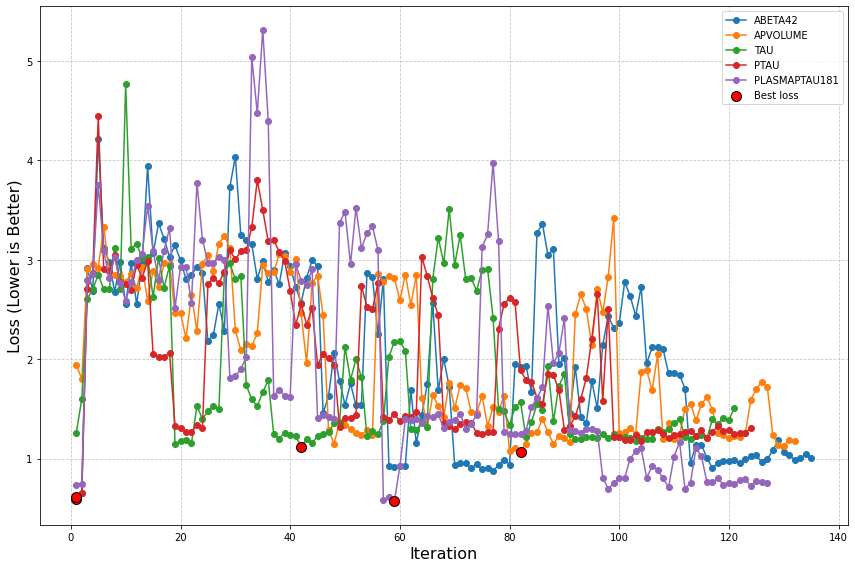

In [ ]:
plot_convergence(ctgan_metrics_history, dependent_variables, "ctgan")

In [ ]:
# OLD

# # Visualize hyperparameter optimization
# def plot_hyperopt_results(trials, hyper_param_name, dependent_variable):
#   '''
#   Plot the values of a hyperparameter against the loss value
#   '''
#   plt.figure(figsize=(12, 6))

#   # Extract parameter values and corresponding values
#   values = [trial["misc"]["vals"][hyper_param_name][0] if isinstance(trial["misc"]["vals"][hyper_param_name], list) and len(trial["misc"]["vals"][hyper_param_name]) > 0 else None for trial in trials.trials]
#   losses = [trial["result"]["loss"] if trial["result"]["status"] == "ok" else float("inf") for trial in trials.trials]

#   # if hyper_param_name in ["batch_size", "embedding_dim", "discriminator_steps", "pac", "epochs"]:
#   #   values = [param_space[hyper_param_name][int(val)] if val is not None else None for val in values]

#   plt.scatter(values, losses, alpha=0.5)
#   plt.xlabel(f"Value of {hyper_param_name}")
#   plt.ylabel("Loss (lower is better)")
#   plt.title(f"Hyperparameter Optimization for {hyper_param_name} - {dependent_variable}")

#   if hyper_param_name in ["generator_lr", "discriminator_lr"]:
#     plt.xscale("log")
#   plt.grid(True, alpha=0.3)
#   plt.tight_layout()
#   plt.show()

In [ ]:
# CTGAN
# Using the best parameters to generate synthetic data from the original dataset
for dependent_variable in dependent_variables:
    print(f"Dependent variable: {dependent_variable}")

    # Filter the dataframe to get all the non-NaN values for the dependent variable and target variables
    filtered_df = filter_dataframe(dependent_variable)

    scalar = RobustScaler()
    scaled_data = scalar.fit_transform(filtered_df)
    scaled_df = pd.DataFrame(scaled_data, columns=filtered_df.columns)

    noise_factor = 0.005
    scaled_df += np.random.normal(0, noise_factor, scaled_df.shape)

    hyper_params = ctgan_best_params[dependent_variable]
    print(f"Training with best parameters: {hyper_params}")

    ctgan = CTGAN(
        epochs=int(hyper_params["epochs"]),
        verbose=True,
        batch_size=int(hyper_params["batch_size"]),
        generator_dim=tuple(map(int, hyper_params["generator_dim"])),
        discriminator_dim=tuple(map(int, hyper_params["discriminator_dim"])),
        generator_lr=hyper_params["generator_lr"],
        discriminator_lr=hyper_params["discriminator_lr"],
        embedding_dim=int(hyper_params["embedding_dim"]),
        pac=int(hyper_params["pac"]),
    )
    # See if data type conversion is needed
    # ctgan = CTGAN(**best_params[dependent_variable])


    ctgan.fit(scaled_df)

    n_samples = 5 * len(filtered_df)
    generated_synthetic_data = ctgan.sample(n_samples)

    # synthetic_data_dict["ctgan"][dependent_variable] = pd.DataFrame(
    #     scalar.inverse_transform(generated_synthetic_data),
    #     columns=scaled_df.columns
    # )
    # synthetic_data = synthetic_data_dict["ctgan"][dependent_variable]
    synthetic_data = pd.DataFrame(
        scalar.inverse_transform(generated_synthetic_data),
        columns=scaled_df.columns
    )

    print(f"Original data shape: {filtered_df.shape}")
    print(f"Synthetic data shape: {synthetic_data.shape}")

    synthetic_data = synthetic_data.sort_values(by=dependent_variable)
    filtered_df = filtered_df.sort_values(by=dependent_variable)

    for col in target_names:
        plot_histogram("ctgan", filtered_df, synthetic_data, dependent_variable, col)

        plot_scatter("ctgan", filtered_df, synthetic_data, dependent_variable, col)

        plot_boxplot("ctgan", filtered_df, synthetic_data, dependent_variable, col)

        print("------------------------------------")

    plot_correlation_heatmap("ctgan", filtered_df, synthetic_data, dependent_variable)
    model_metrics["ctgan"][dependent_variable] = evaluate_model(filtered_df, synthetic_data)

    # synthetic_data_dict["ctgan"][dependent_variable] = synthetic_data
    # original_data_dict[dependent_variable] = filtered_df

    print(f"------------------------------------------------------------------------------------------------------------")

Dependent variable: ABETA42


NameError: name 'RobustScaler' is not defined

In [255]:
import csv
import re

def save_hyperparameters_as_csv(best_params, dependent_variables, model_name):
    """
    Save the hyperparameters for each dependent variable as a CSV file.

    Parameters:
        best_params (dict): A dictionary containing the best hyperparameters for each dependent variable.
        dependent_variables (list): A list of dependent variables.
        model_name (str): The name of the model used to generate the hyperparameters.
    """

    # Collect all unique hyperparameters
    all_hyperparams = set()
    all_hyperparams.update(best_params[dependent_variables[0]].keys())
    all_hyperparams = list(all_hyperparams)

    # Create the directory to save the CSV file
    save_path = os.path.join(f"./hyperparameters/{model_name}")
    os.makedirs(save_path, exist_ok=True)  # Create directory if it doesn't exist

    # Create the CSV file
    with open(f"./hyperparameters/{model_name}/{model_name}_hyperparams.csv", mode='w', newline='') as file:
        writer = csv.writer(file)

        # Write header row (Hyperparameter names + dependent variables)
        writer.writerow(["Hyperparameter"] + dependent_variables)

        # Write hyperparameter values for each dependent variable in a column format
        for hyperparam in all_hyperparams:
            row = [hyperparam]  # Start row with hyperparameter name
            for dependent_variable in dependent_variables:
                value = best_params[dependent_variable].get(hyperparam, "N/A")  # Handle missing values

                # Convert tuples to readable format
                if isinstance(value, tuple):
                    value = "-".join(map(str, value))
                
                # Convert to string for processing
                value_str = str(value)
                
                # Convert scientific notation (e.g., 1e-10 to 10^-10)
                match = re.search(r'\d*\.?\d*[eE]([-+]\d+)', value_str)
                if match:
                    exponent = match.group(1)
                    value_str = f"10^{exponent}"

                # Escape underscores for LaTeX
                hyperparam_safe = hyperparam.replace("_", r"\_")
                row[0] = hyperparam_safe  # Ensure the hyperparameter name is escaped
                row.append(value)

            writer.writerow(row)  # Write full row

    print(f"CSV file './hyperparameters/{model_name}/{model_name}_hyperparams.csv' generated successfully.")

def save_metrics_as_csv(model_metrics, dependent_variables, model_name):
    """
    Save the evaluation metrics for each dependent variable as a CSV file.

    Parameters:
        model_metrics (dict): A dictionary containing the evaluation metrics for each dependent variable.
        dependent_variables (list): A list of dependent variables.
        model_name (str): The name of the model used to generate the metrics.
    """

    # Collect all unique metrics
    all_metrics = set()
    all_metrics.update(model_metrics[dependent_variables[0]].keys())
    all_metrics = list(sorted(all_metrics))
    # all_metrics = list(all_metrics).sort()    # Does not work for gaussian copula

    # Create the directory to save the CSV file
    save_path = os.path.join(f"./metrics/{model_name}")
    os.makedirs(save_path, exist_ok=True)  # Create directory if it doesn't exist

    # Create the CSV file
    with open(f"./metrics/{model_name}/{model_name}_metrics.csv", mode='w', newline='') as file:
        writer = csv.writer(file)

        # Write header row (Metric names + dependent variables)
        writer.writerow(["Metric"] + dependent_variables)

        # Write metric values for each dependent variable in a column format
        for metric in all_metrics:
            row = [metric]  # Start row with metric name
            for dependent_variable in dependent_variables:
                value = model_metrics[dependent_variable].get(metric, "N/A")  # Handle missing values

                # Convert tuples to readable format
                if isinstance(value, tuple):
                    value = "-".join(map(str, value))

                # Escape underscores for LaTeX
                metric_safe = metric.replace("_", r"\_")
                row[0] = metric_safe  # Ensure the metric name is escaped
                row.append(value)

            writer.writerow(row)  # Write full row

    print(f"CSV file './metrics/{model_name}/{model_name}_metrics.csv' generated successfully.")

In [ ]:
save_hyperparameters_as_csv(ctgan_best_params, dependent_variables, "ctgan")
save_metrics_as_csv(model_metrics["ctgan"], dependent_variables, "ctgan")

CSV file './hyperparameters/ctgan/ctgan_hyperparams.csv' generated successfully.
CSV file './metrics/ctgan/ctgan_metrics.csv' generated successfully.


In [256]:
model_metrics["ctgan"]

{'ABETA42': Empty DataFrame
 Columns: []
 Index: [],
 'APVOLUME': Empty DataFrame
 Columns: []
 Index: [],
 'TAU': Empty DataFrame
 Columns: []
 Index: [],
 'PTAU': Empty DataFrame
 Columns: []
 Index: [],
 'PLASMAPTAU181': Empty DataFrame
 Columns: []
 Index: []}

In [81]:
model_metrics["ctgan"]

{'ABETA42': {'correlation_diff': 0.12182763528657421,
  'jensen_shannon_divergence': 0.12098391535581139,
  'summary_stats': 0.028308602081651014},
 'APVOLUME': {'correlation_diff': 0.21661869782252555,
  'jensen_shannon_divergence': 0.1362423802762616,
  'summary_stats': 0.025960810699972803},
 'TAU': {'correlation_diff': 0.3214835211593549,
  'jensen_shannon_divergence': 0.1640902912162002,
  'summary_stats': 0.0414812723388184},
 'PTAU': {'correlation_diff': 0.19391241702857245,
  'jensen_shannon_divergence': 0.12240398293004312,
  'summary_stats': 0.023716109246417916},
 'PLASMAPTAU181': {'correlation_diff': 0.09238135910460657,
  'jensen_shannon_divergence': 0.07673005037599301,
  'summary_stats': 0.021584563376684726}}

In [257]:
from scipy import stats

class GaussianCopula:
    """
    Gaussian Copula model for synthetic data generation.
    
    This model captures the dependencies between variables using a Gaussian copula 
    and can generate synthetic data that preserves these dependencies.
    """
    
    def __init__(self, correlation_method='spearman', covariance_regularization=0.01, 
                 marginal_distribution='auto', tail_estimation_factor=0.05, n_kde_points=1000):
        """
        Initialize the Gaussian Copula model.
        
        Parameters:
            correlation_method (str): Method to compute correlation matrix ('pearson', 'kendall', 'spearman')
            covariance_regularization (float): Factor to regularize the covariance matrix
            marginal_distribution (str): Method for marginal distributions ('auto', 'kde', 'empirical')
            tail_estimation_factor (float): Proportion of data used for tail estimation
            n_kde_points (int): Number of points used for KDE estimation
        """
        self.correlation_method = correlation_method
        self.covariance_regularization = covariance_regularization
        self.marginal_distribution = marginal_distribution
        self.tail_estimation_factor = tail_estimation_factor
        self.n_kde_points = n_kde_points
        self.fitted = False
        
    def _fit_marginals(self, data):
        """Fit marginal distributions for each column"""
        self.marginals = {}
        self.columns = data.columns
        
        for col in self.columns:
            col_data = data[col].values
            
            if self.marginal_distribution == 'kde' or (
                self.marginal_distribution == 'auto' and len(col_data) > 100):
                # Use KDE for continuous variables with enough data
                self.marginals[col] = {
                    'type': 'kde',
                    'kde': stats.gaussian_kde(col_data),
                    'min': np.min(col_data),
                    'max': np.max(col_data)
                }
            else:
                # Use empirical CDF for smaller datasets or discrete variables
                self.marginals[col] = {
                    'type': 'empirical',
                    'data': col_data
                    # 'ecdf': stats.ecdf(col_data)
                }
    
    def _estimate_copula(self, data):
        """Estimate the Gaussian copula parameters"""
        # Transform data to uniform marginals
        u_data = pd.DataFrame(index=data.index, columns=data.columns)
        
        for col in self.columns:
            col_data = data[col].values
            if self.marginals[col]['type'] == 'kde':
                kde = self.marginals[col]['kde']
                # Evaluate CDF at each point
                u_data[col] = np.array([stats.norm.cdf(stats.norm.ppf(kde.integrate_box_1d(-np.inf, x))) 
                                      for x in col_data])
            else:
                # Use empirical CDF
                # ecdf = self.marginals[col]['ecdf']
                # u_data[col] = ecdf(col_data)

                sorted_data = np.sort(self.marginals[col]['data'])
                ranks = np.searchsorted(sorted_data, col_data, side='right')
                # Convert to [0,1] range and avoid 0 and 1 exactly
                u_data[col] = np.clip((ranks) / len(sorted_data), 0.001, 0.999)
        
        # Apply inverse normal CDF to get normal marginals
        z_data = u_data.apply(lambda x: stats.norm.ppf(x.clip(0.001, 0.999)))
        
        # Compute correlation matrix
        self.correlation_matrix = z_data.corr(method=self.correlation_method)
        
        # Regularize correlation matrix to ensure positive definiteness
        n = len(self.correlation_matrix)
        self.correlation_matrix = (1 - self.covariance_regularization) * self.correlation_matrix + \
                                  self.covariance_regularization * np.identity(n)
    
    def fit(self, data):
        """
        Fit the Gaussian Copula model to the data.
        
        Parameters:
            data (pd.DataFrame): The data to fit the model to.
        """
        self._fit_marginals(data)
        self._estimate_copula(data)
        self.fitted = True
        return self
    
    def sample(self, n_samples):
        """
        Generate synthetic samples from the fitted Gaussian Copula model.
        
        Parameters:
            n_samples (int): Number of samples to generate.
            
        Returns:
            pd.DataFrame: Generated synthetic samples.
        """
        if not self.fitted:
            raise ValueError("Model must be fitted before sampling")
            
        # Generate multivariate normal samples
        mvn_samples = np.random.multivariate_normal(
            mean=np.zeros(len(self.columns)),
            cov=self.correlation_matrix,
            size=n_samples
        )
        
        # Transform to uniform using normal CDF
        u_samples = stats.norm.cdf(mvn_samples)
        
        # Create DataFrame to hold the final samples
        synthetic_data = pd.DataFrame(columns=self.columns)
        
        # Transform uniform samples back to original marginal distributions
        for i, col in enumerate(self.columns):
            if self.marginals[col]['type'] == 'kde':
                kde = self.marginals[col]['kde']
                # Create a grid of points and their corresponding CDF values
                x_grid = np.linspace(self.marginals[col]['min'], self.marginals[col]['max'], 
                                    self.n_kde_points)
                cdf_grid = np.array([kde.integrate_box_1d(-np.inf, x) for x in x_grid])
                
                # For each uniform sample, find the closest CDF value and use the corresponding x
                synthetic_data[col] = np.interp(u_samples[:, i], cdf_grid, x_grid)
            else:
                # Use inverse empirical CDF (percentile method)
                data = self.marginals[col]['data']
                synthetic_data[col] = np.percentile(data, u_samples[:, i] * 100)
        
        return synthetic_data

In [258]:
from hyperopt import hp

# Define the parameter search space for Gaussian Copula
gaussian_copula_param_space = {
    "correlation_method": hp.choice("correlation_method", ["pearson", "kendall", "spearman"]),
    "covariance_regularization": hp.loguniform("covariance_regularization", np.log(0.001), np.log(0.1)),
    "marginal_distribution": hp.choice("marginal_distribution", ["auto", "kde", "empirical"]),
    "tail_estimation_factor": hp.uniform("tail_estimation_factor", 0.01, 0.2),
    "n_kde_points": hp.choice("n_kde_points", [500, 1000, 2000, 5000])
}

In [259]:
from hyperopt import fmin, tpe, Trials, STATUS_OK, STATUS_FAIL, space_eval

def gaussian_copula_bayesian_optimization(dependent_variable, df, param_space):
    """
    Perform Bayesian optimization for the Gaussian Copula model parameters.
    
    Parameters:
        dependent_variable (str): Name of the dependent variable
        df (pd.DataFrame): The dataframe containing the data
        param_space (dict): The parameter search space
        evaluate_model (function): Function to evaluate the model
        compute_normalised_score (function): Function to compute the normalized score
        
    Returns:
        actual_params (dict): The best parameters found
        trials (Trials): The trials object containing the results
        metrics_hist (list): History of metrics during optimization
    """
    # Initialize metric collection for normalization
    all_metrics = {
        "correlation_diff": [],
        "jensen_shannon_divergence": [],
        "summary_stats": []
    }
    
    metrics_hist = []
    
    # Define the objective function
    def objective(params):
        # Track the best loss seen so far
        if not hasattr(objective, "best_loss"):
            objective.best_loss = float("inf")
            
        try:
            # Initialize the Gaussian Copula model with the current parameters
            copula_model = GaussianCopula(
                correlation_method=params["correlation_method"],
                covariance_regularization=params["covariance_regularization"],
                marginal_distribution=params["marginal_distribution"],
                tail_estimation_factor=params["tail_estimation_factor"],
                n_kde_points=int(params["n_kde_points"])
            )
            
            # Fit the model
            copula_model.fit(df)
            
            # Generate synthetic data
            synthetic_data = copula_model.sample(5 * len(df))
            
            # Evaluate the synthetic data
            metrics = evaluate_model(df, synthetic_data)
            
            # Collect metrics for normalization
            for k in all_metrics.keys():
                all_metrics[k].append(metrics[k])
                
            # Compute the normalized score
            score = compute_normalised_score(all_metrics, metrics)
            
            # Update best loss if needed
            if score < objective.best_loss:
                objective.best_loss = score
                
            metrics_hist.append({
                "epoch": len(metrics_hist) + 1,
                "score": score,
                "metrics": metrics
            })
                
            return {
                "loss": score,  # Hyperopt minimizes the loss
                "status": STATUS_OK,  # Successful run
                "metrics": metrics,  # Additional information
                "synthetic_data": synthetic_data  # Store synthetic data for the best run
            }
            
        except Exception as e:
            print(f"Error: {e}")
            return {
                "loss": float("inf"),  # Set loss to infinity in case of an error
                "status": STATUS_FAIL,  # Unsuccessful run
                "exception": str(e)  # Store the exception for debugging
            }
    
    # Initialize the trials object
    trials = Trials()
    
    # Run Bayesian optimization
    best = fmin(
        fn=objective,
        space=param_space,
        algo=tpe.suggest,
        max_evals=25,  # Maximum number of evaluations
        trials=trials
    )
    
    # Get the actual parameter values
    actual_params = space_eval(param_space, best)
    
    print(f"Best Parameters for {dependent_variable}: {actual_params}")
    print(f"Best Score: {trials.best_trial['result']['loss']}")
    
    return actual_params, trials, metrics_hist

In [260]:
# Gaussian Copula hyperparameter optimization
from sklearn.preprocessing import RobustScaler
import time

# Dictionary to store the best parameters, results and metrics history for each dependent variable
best_params = {}
results = {}
metrics_history = {}

start_time = time.time()

for dependent_variable in dependent_variables:
    print(f"Dependent variable: {dependent_variable}")

    # Filter the dataframe to get all the non-NaN values for the dependent variable and target variables
    filtered_df = filter_dataframe(dependent_variable)

    scalar = RobustScaler()
    scaled_data = scalar.fit_transform(filtered_df)
    scaled_df = pd.DataFrame(scaled_data, columns=filtered_df.columns)

    noise_factor = 0.005
    scaled_df += np.random.normal(0, noise_factor, scaled_df.shape)

    # Run the Bayesian optimization for Gaussian Copula
    best_params[dependent_variable], results[dependent_variable], metrics_history[dependent_variable] = gaussian_copula_bayesian_optimization(
        dependent_variable, scaled_df, gaussian_copula_param_space)

end_time = time.time()
gaussian_copula_execution_time = end_time - start_time
print(f"Execution time: {gaussian_copula_execution_time} seconds")

Dependent variable: ABETA42
Mean absolute difference (MAD) of the correlation matrices: 0.06435663890553298
JS Divergence: 0.048160532936714746                   
Summary stats 0.023775989708545674                    
Mean absolute difference (MAD) of the correlation matrices: 0.02948431610239715  
JS Divergence: 0.04396460441401026                                               
Summary stats 0.04121827405380741                                                
Mean absolute difference (MAD) of the correlation matrices: 0.09882426430627196  
JS Divergence: 0.03559854524111958                                               
Summary stats 0.031916896671380375                                               
Mean absolute difference (MAD) of the correlation matrices: 0.04792097648144755  
JS Divergence: 0.04180922239595795                                               
Summary stats 0.02228964455019407                                                
Mean absolute difference (MAD) of the correl

In [261]:
best_params["ABETA42"]

{'correlation_method': 'spearman',
 'covariance_regularization': 0.03753910069936866,
 'marginal_distribution': 'kde',
 'n_kde_points': 5000,
 'tail_estimation_factor': 0.09985268632043108}

In [262]:
print("best trial loss")
print(results["ABETA42"].best_trial['result']['loss'])

print("best trial metrics")
print(results["ABETA42"].best_trial['result']['metrics'])

print("results")
print(results["ABETA42"].results)

best trial loss
0.11466719457021482
best trial metrics
{'correlation_diff': 0.02948431610239715, 'jensen_shannon_divergence': 0.04396460441401026, 'summary_stats': 0.04121827405380741}
results
[{'loss': 0.13629316155079338, 'status': 'ok', 'metrics': {'correlation_diff': 0.06435663890553298, 'jensen_shannon_divergence': 0.048160532936714746, 'summary_stats': 0.023775989708545674}, 'synthetic_data':       ABETA42    ST58TA   ST117TA    ST40TA    ST99TA    ST32TA    ST91TA  \
0    0.180804 -0.300679 -0.247392 -0.793908 -1.327373 -0.985454 -1.582480   
1   -0.220804  0.116213 -0.333216 -0.113340  0.538816  0.445710  0.460165   
2    0.224546 -0.894721 -1.999544 -1.676351 -2.314807 -1.275065 -1.787514   
3    0.616862 -0.357526  0.062257  0.685627  0.933112  0.145467  0.681773   
4    0.670417 -1.124361 -0.756741  0.130478 -0.347512 -0.399490 -0.268678   
..        ...       ...       ...       ...       ...       ...       ...   
440  0.092266 -0.578013 -1.955895 -1.309574 -1.526817 -0.58

In [263]:
results["ABETA42"].trials

[{'state': 2,
  'tid': 0,
  'spec': None,
  'result': {'loss': 0.13629316155079338,
   'status': 'ok',
   'metrics': {'correlation_diff': 0.06435663890553298,
    'jensen_shannon_divergence': 0.048160532936714746,
    'summary_stats': 0.023775989708545674},
   'synthetic_data':       ABETA42    ST58TA   ST117TA    ST40TA    ST99TA    ST32TA    ST91TA  \
   0    0.180804 -0.300679 -0.247392 -0.793908 -1.327373 -0.985454 -1.582480   
   1   -0.220804  0.116213 -0.333216 -0.113340  0.538816  0.445710  0.460165   
   2    0.224546 -0.894721 -1.999544 -1.676351 -2.314807 -1.275065 -1.787514   
   3    0.616862 -0.357526  0.062257  0.685627  0.933112  0.145467  0.681773   
   4    0.670417 -1.124361 -0.756741  0.130478 -0.347512 -0.399490 -0.268678   
   ..        ...       ...       ...       ...       ...       ...       ...   
   440  0.092266 -0.578013 -1.955895 -1.309574 -1.526817 -0.582275 -0.972715   
   441  0.384649  0.289853 -0.512991 -1.186096 -0.517709 -1.304081 -0.516600   
   4

In [ ]:
plot_convergence(metrics_history, dependent_variables, "gc")

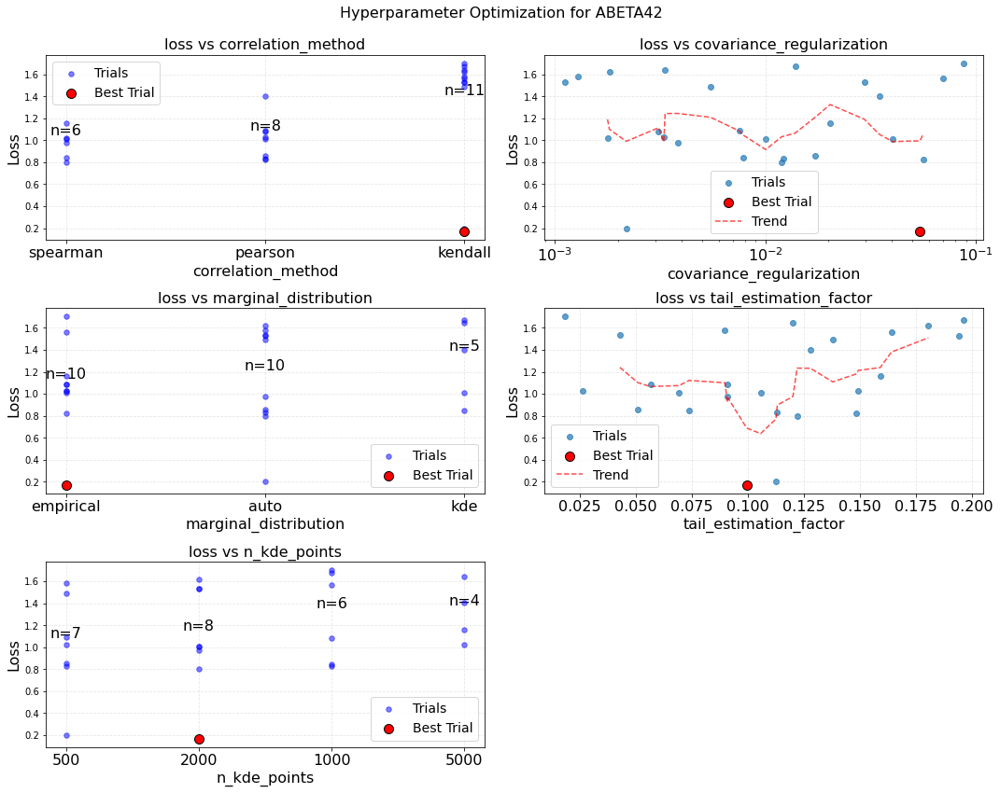

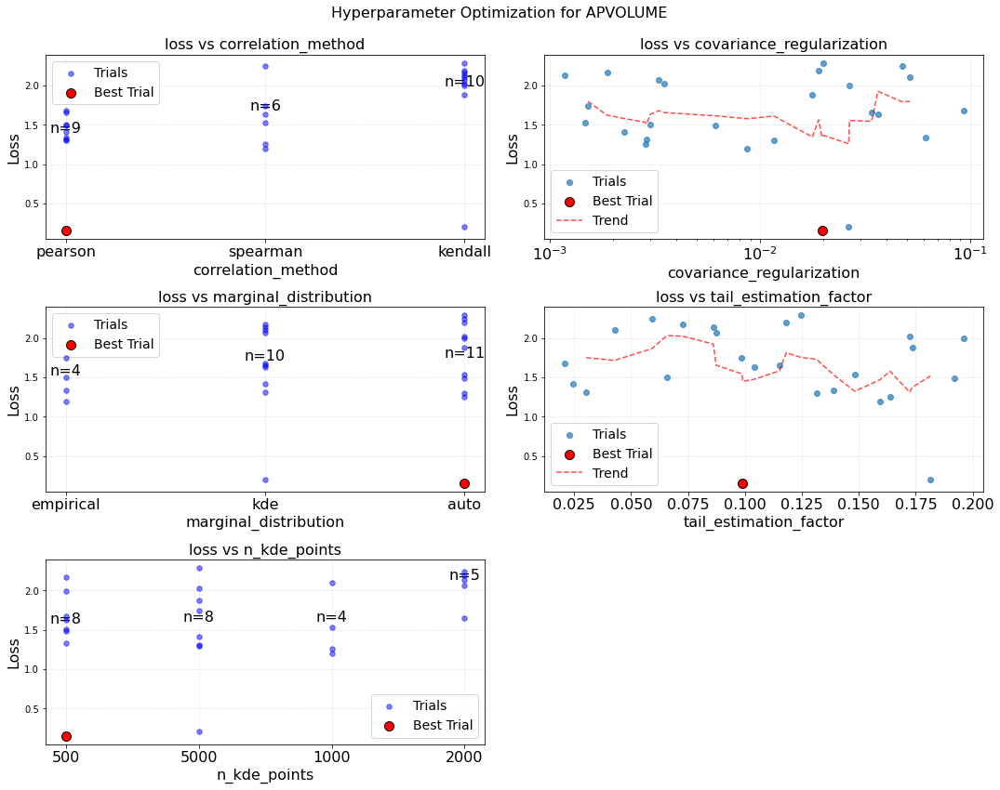

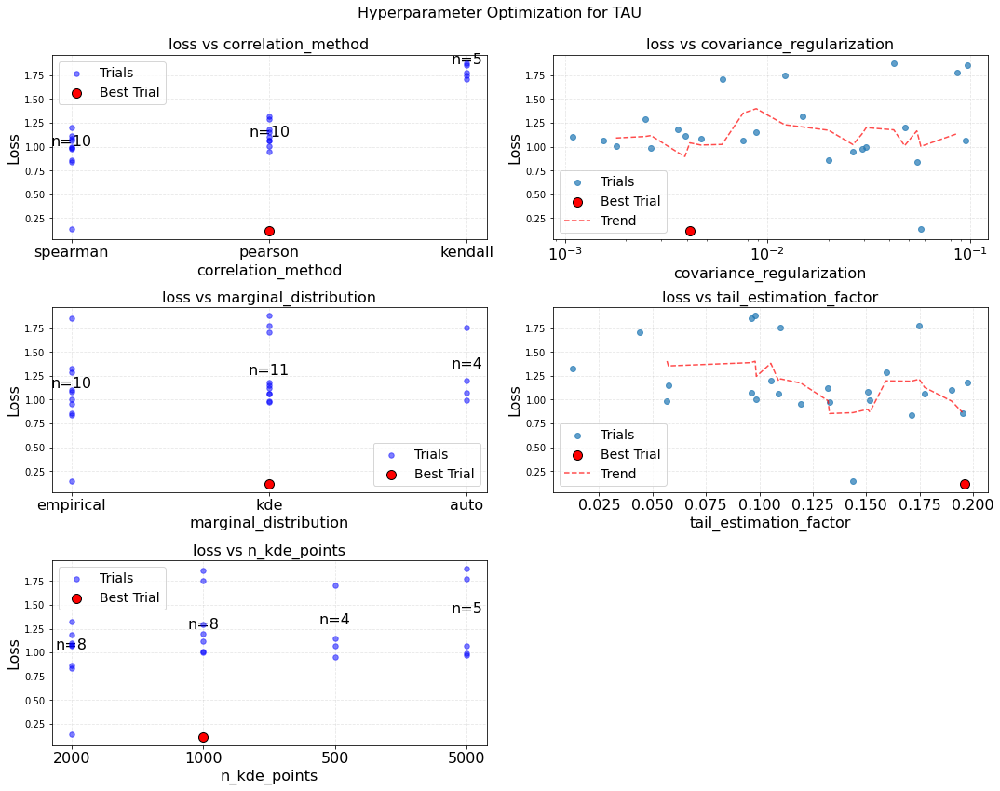

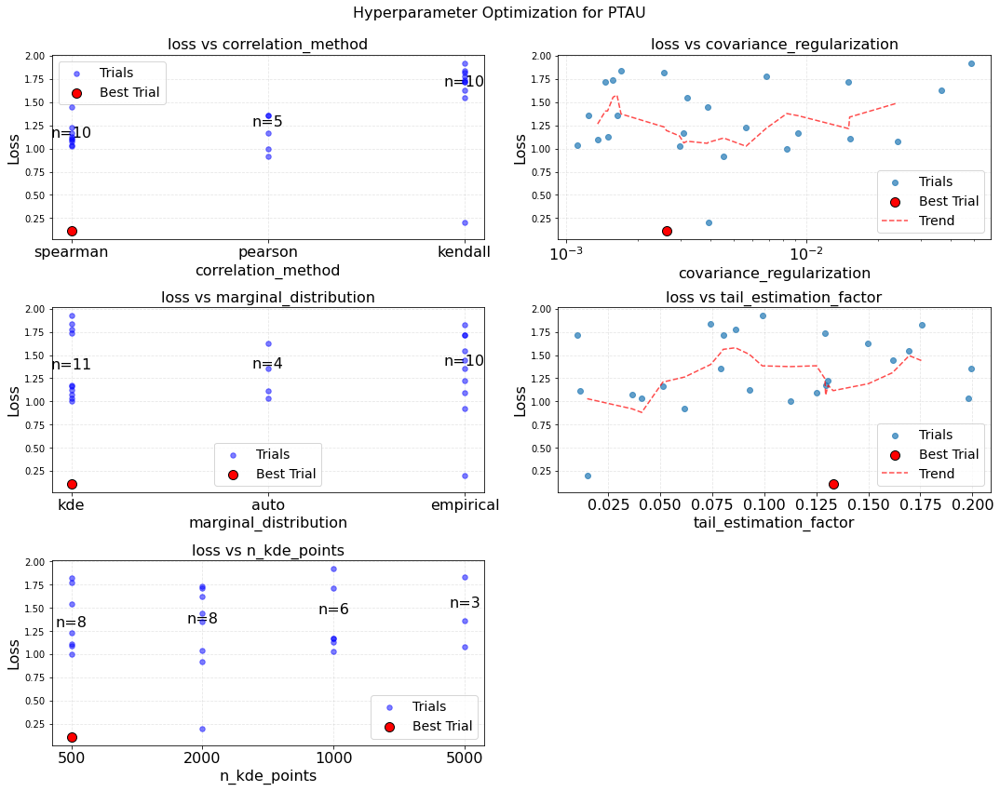

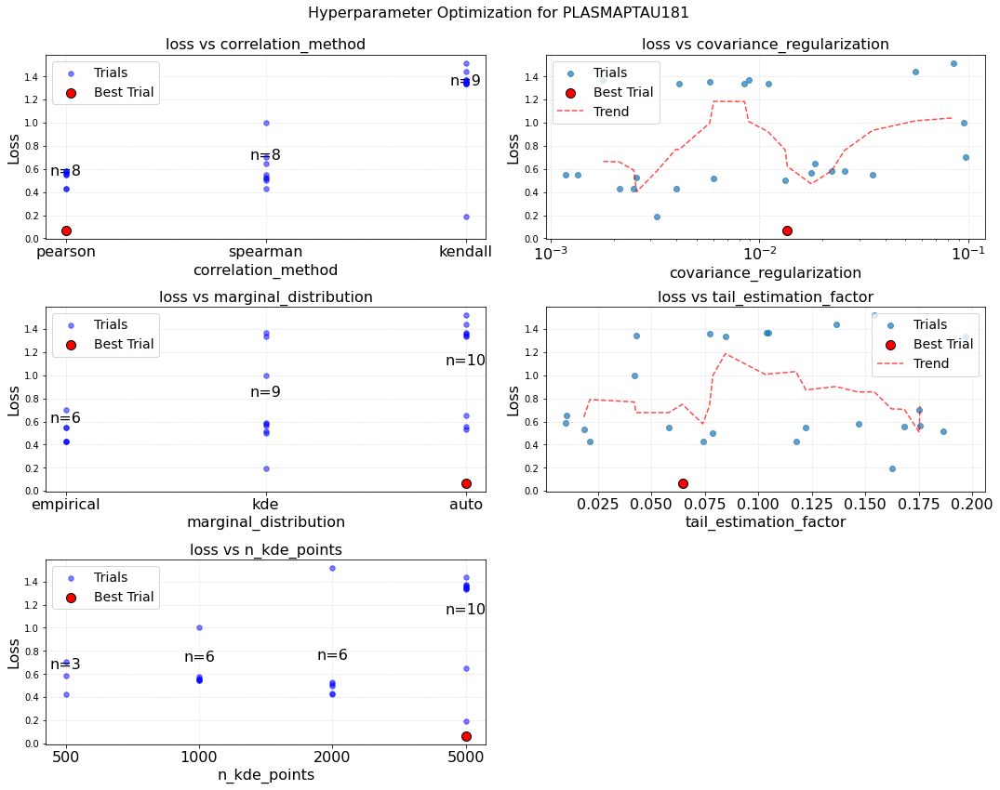

In [64]:
def plot_hyperparameter_optimization_by_variable(trials, dependent_variable, param_space, best_params):
    # Determine how many parameters to plot
    params = list(param_space.keys())
    n_params = len(params)
    
    # Define mappings for categorical parameters
    categorical_mappings = {
        "correlation_method": {0: "pearson", 1: "kendall", 2: "spearman"},
        "marginal_distribution": {0: "auto", 1: "kde", 2: "empirical"},
        "n_kde_points": {0: 500, 1: 1000, 2: 2000, 3: 5000}
    }
    
    # Create a grid of subplots
    n_cols = 2
    n_rows = (n_params + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4*n_rows))
    axes = axes.flatten()  # Flatten for easier indexing
    
    # Get the actual best parameters for this dependent variable
    best_param_values = best_params[dependent_variable]
    
    # Create plots for each hyperparameter
    for i, param_name in enumerate(params):
        if i < len(axes):
            ax = axes[i]
            
            # Check if parameter is categorical
            is_categorical = param_name in categorical_mappings
            
            # Extract data
            values = []
            categories = []
            losses = []
            
            for trial in trials.trials:
                if trial["result"]["status"] == "ok":
                    if param_name in trial["misc"]["vals"] and len(trial["misc"]["vals"][param_name]) > 0:
                        value = trial["misc"]["vals"][param_name][0]
                        values.append(value)
                        
                        # For categorical parameters, map index to actual value
                        if is_categorical:
                            category = categorical_mappings[param_name].get(int(value), str(value))
                            categories.append(category)
                        
                        losses.append(trial["result"]["loss"])
            
            # Create DataFrame
            if is_categorical:
                df = pd.DataFrame({
                    'value': values,
                    'category': categories,
                    'loss': losses
                })
            else:
                df = pd.DataFrame({
                    'value': values,
                    'loss': losses
                })
            
            # Plot based on parameter type
            if is_categorical:
                # Group by category and calculate statistics
                grouped = df.groupby('category')['loss'].agg(['mean', 'min', 'count']).reset_index()
                grouped = grouped.sort_values('mean')
                
                # Add individual points
                ax.scatter([], [], color='blue', alpha=0.5, s=30, label='Trials')
                for j, category in enumerate(grouped['category']):
                    category_df = df[df['category'] == category]
                    ax.scatter([j] * len(category_df), category_df['loss'], 
                              color='blue', alpha=0.5, zorder=10, s=30)
                
                # Mark the best category based on the known best parameters
                best_category = best_param_values[param_name]
                best_cat_idx = None
                for j, cat in enumerate(grouped['category']):
                    if cat == best_category:
                        best_cat_idx = j
                        break
                
                if best_cat_idx is not None:
                    # Find minimum loss for the best category
                    best_cat_trials = df[df['category'] == best_category]
                    if not best_cat_trials.empty:
                        best_loss_value = best_cat_trials['loss'].min()
                        ax.scatter(best_cat_idx, best_loss_value, color='red', s=100, 
                                 edgecolor='black', zorder=15, label='Best Trial')
                
                # Set x-axis labels to categories
                ax.set_xticks(range(len(grouped)))
                ax.set_xticklabels(grouped['category'], fontsize=16)
                
                # Add count labels
                for j, (_, row) in enumerate(grouped.iterrows()):
                    ax.annotate(f'n={int(row["count"])}', 
                               xy=(j, row['mean'] + 0.05), 
                               ha='center', va='bottom', fontsize=16)
            else:
                # For continuous parameters, use scatter plot
                ax.scatter(df['value'], df['loss'], alpha=0.7, label='Trials')
                
                # Mark the best value based on the known best parameters  
                best_value = best_param_values[param_name]
                
                # Find the closest trial to the best value
                closest_idx = np.argmin(np.abs(df['value'] - best_value))
                if not df.empty and closest_idx < len(df):
                    closest_value = df['value'].iloc[closest_idx]
                    closest_loss = df['loss'].iloc[closest_idx]
                    ax.scatter(best_value, closest_loss, 
                              color='red', s=100, edgecolor='black', zorder=10, label='Best Trial')
                
                # Add trend line
                if not df.empty and len(df) > 2:
                    df_sorted = df.sort_values('value')
                    window_size = min(5, len(df) // 2) if len(df) > 4 else 2
                    if window_size >= 2:
                        df_sorted['smooth_loss'] = df_sorted['loss'].rolling(window=window_size, center=True).mean()
                        ax.plot(df_sorted['value'], df_sorted['smooth_loss'], 'r--', alpha=0.7, label='Trend')
                
                # Set log scale if needed
                if param_name == "covariance_regularization":
                    ax.set_xscale("log")
                ax.tick_params(axis='x', labelsize=16)
            
            # Set labels
            ax.set_xlabel(f"{param_name}", fontsize=16)
            ax.set_ylabel("Loss", fontsize=16)
            ax.set_title(f"loss vs {param_name}", fontsize=16)
            ax.grid(True, alpha=0.3, linestyle='--')
            
            # Add legend - only show relevant items
            handles, labels = ax.get_legend_handles_labels()
            if handles:  # Only add legend if there are items to show
                ax.legend(fontsize=14, loc='best')
    
    # Turn off any unused subplots
    for i in range(len(params), len(axes)):
        axes[i].axis('off')
    
    # Add overall title
    plt.suptitle(f"Hyperparameter Optimization for {dependent_variable}", fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)  # Make room for suptitle
    
    plt.savefig(f"optimization_plots/gs_{dependent_variable}_hyperparameter_optimization.png", dpi=300)
    plt.show()
    plt.close()

# Usage
for dependent_variable in dependent_variables:
    plot_hyperparameter_optimization_by_variable(
        results[dependent_variable], 
        dependent_variable, 
        gaussian_copula_param_space,
        best_params  # Pass the best_params dictionary
    )

In [73]:
def create_trials_dataframe(trials):
    """
    Convert the trials object to a DataFrame for visualization
    """
    records = []
    
    for i, trial in enumerate(trials.trials):
        # Skip failed trials
        if trial['result']['status'] == 'fail':
            continue
            
        # Get parameter values
        params = trial['misc']['vals']
        
        # Extract parameter values
        record = {
            'iteration': i,
            'loss': trial['result']['loss']
        }
        
        # Add parameter values
        for param_name, param_values in params.items():
            if param_values:  # If not empty
                record[param_name] = param_values[0]
        
        records.append(record)
    
    return pd.DataFrame(records)

# Create DataFrames from trials
trials_dfs = {}
for var in dependent_variables:
    trials_dfs[var] = create_trials_dataframe(results[var])

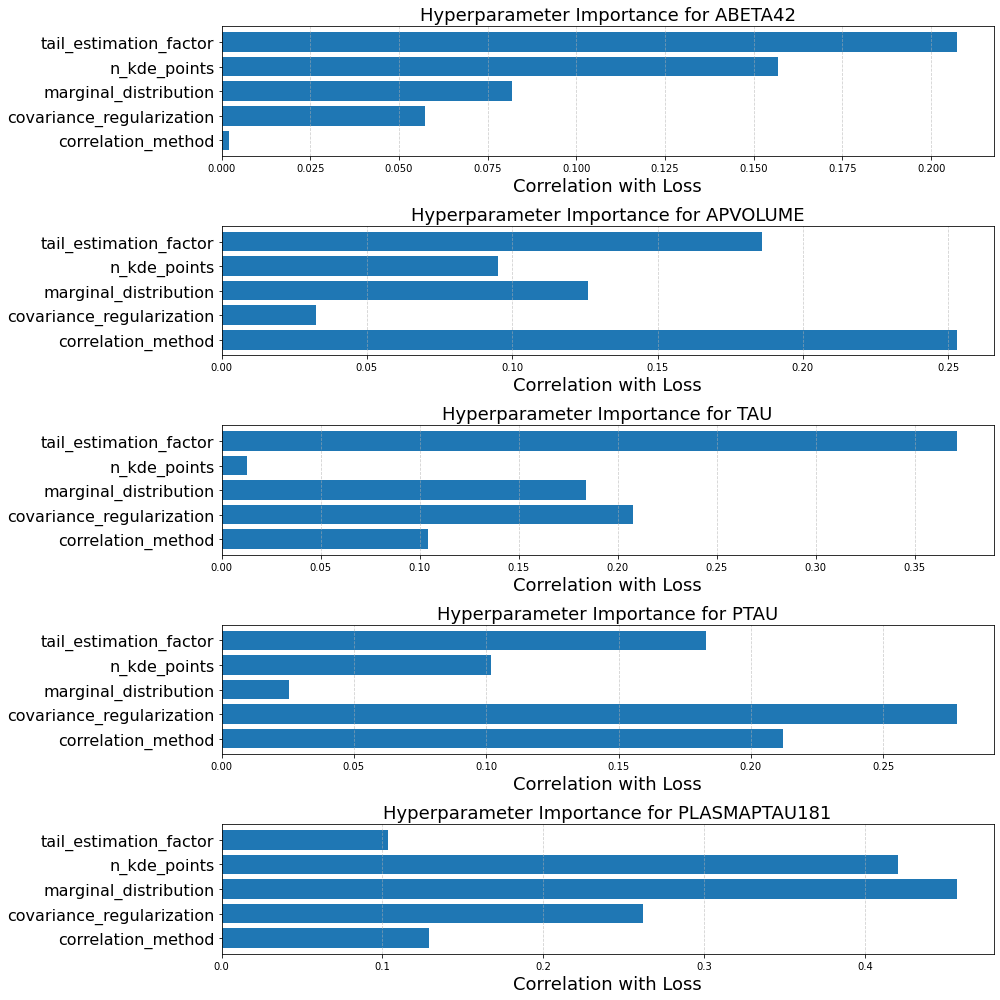

In [74]:
def plot_hyperparameter_importance(trials_dfs, dependent_variables):
    """
    Visualize the importance of each hyperparameter based on correlation with loss
    """
    plt.figure(figsize=(14, 14))
    
    for i, var in enumerate(dependent_variables):
        if var not in trials_dfs:
            continue
            
        df = trials_dfs[var]
        param_columns = [col for col in df.columns if col not in ['iteration', 'loss']]
        
        # Calculate correlation with loss
        correlations = []
        for param in param_columns:
            # Skip categorical parameters or parameters with too few unique values
            if df[param].dtype == 'object' or len(df[param].unique()) < 3:
                correlations.append(0)
                continue
                
            corr = np.abs(df[param].corr(df['loss']))
            correlations.append(corr)
        
        # Plot as horizontal bar chart
        plt.subplot(len(dependent_variables), 1, i+1)
        plt.barh(param_columns, correlations)
        plt.title(f'Hyperparameter Importance for {var}', fontsize=18)
        plt.xlabel('Correlation with Loss', fontsize=18)
        plt.yticks(fontsize=16)
        plt.grid(axis='x', linestyle='--', alpha=0.6)
    
    plt.tight_layout()
    plt.savefig(f"optimization_plots/gs_hyperparameter_importance.png", dpi=300)
    plt.show()
    plt.close()

plot_hyperparameter_importance(trials_dfs, dependent_variables)

Dependent variable: ABETA42
Training with best parameters: {'correlation_method': 'spearman', 'covariance_regularization': 0.03753910069936866, 'marginal_distribution': 'kde', 'n_kde_points': 5000, 'tail_estimation_factor': 0.09985268632043108}
Original data shape: (89, 11)
Synthetic data shape: (445, 11)


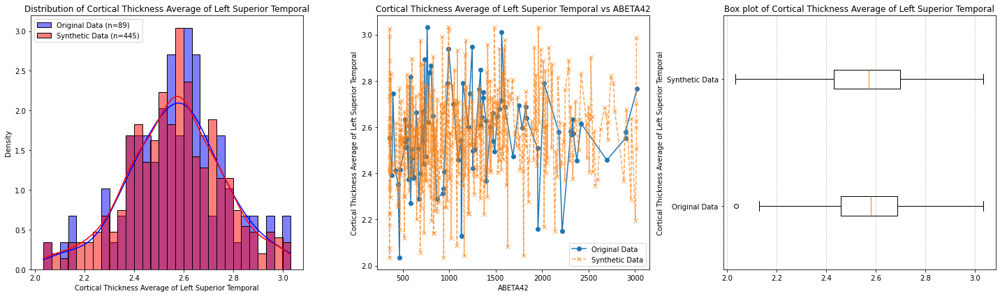

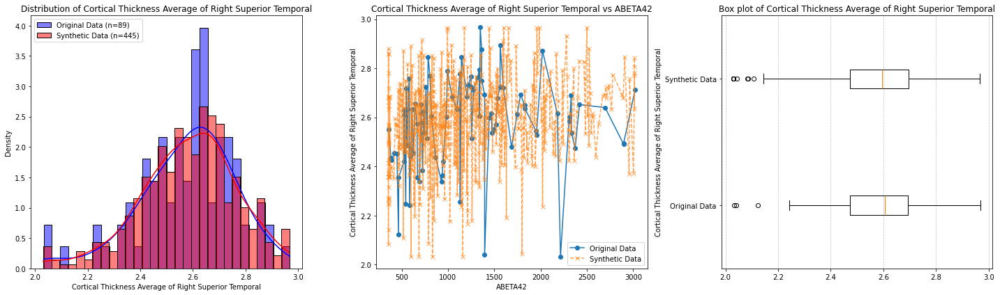

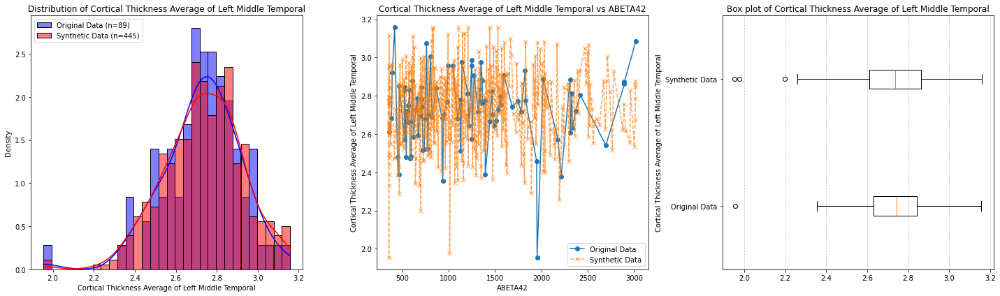

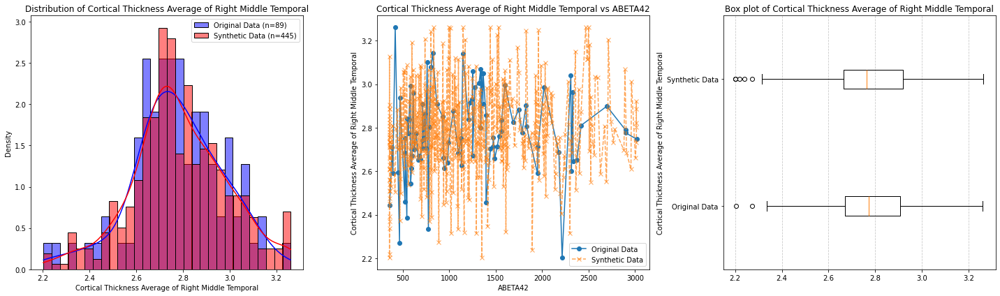

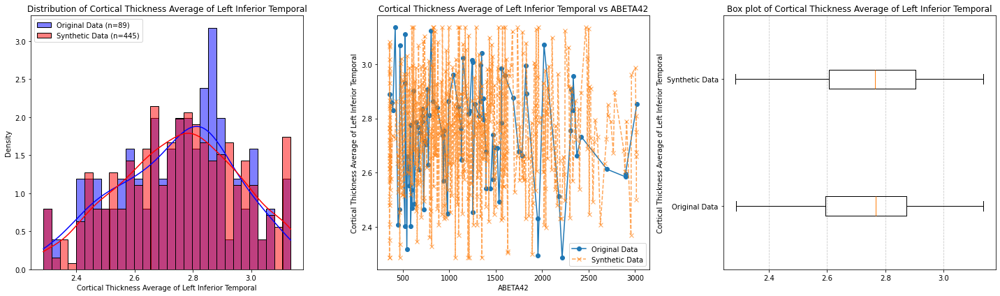

...

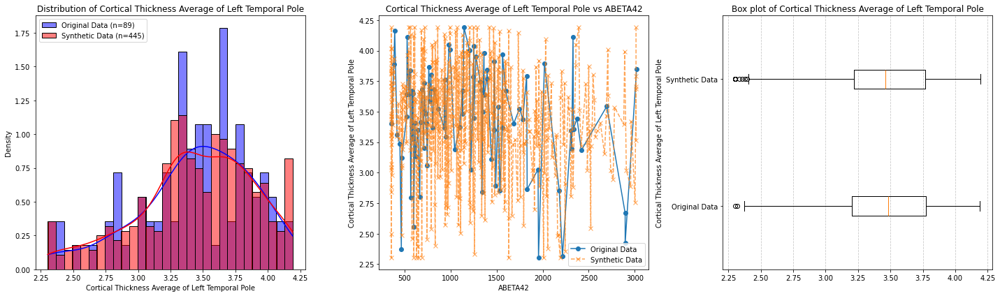

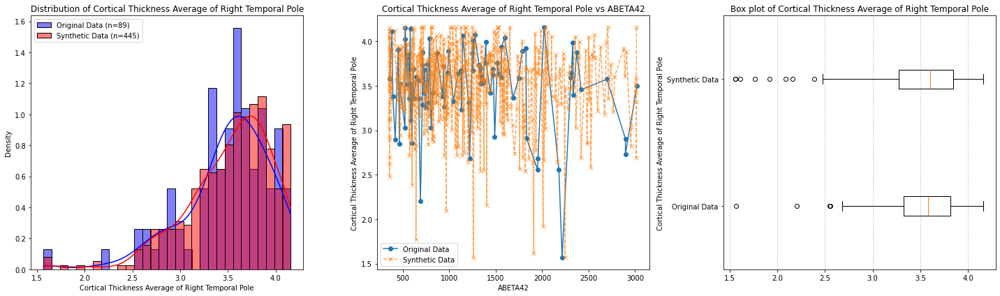

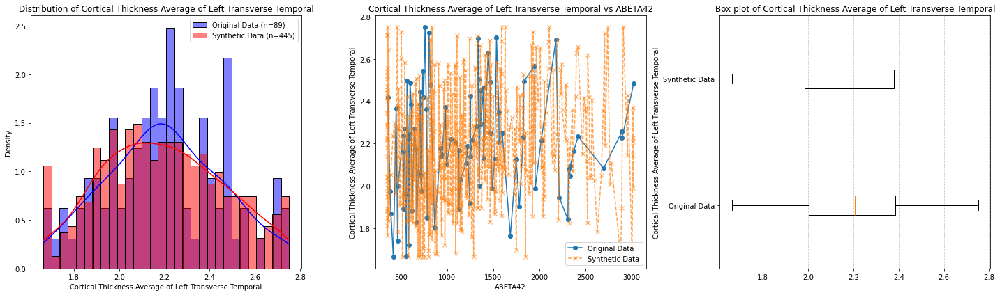

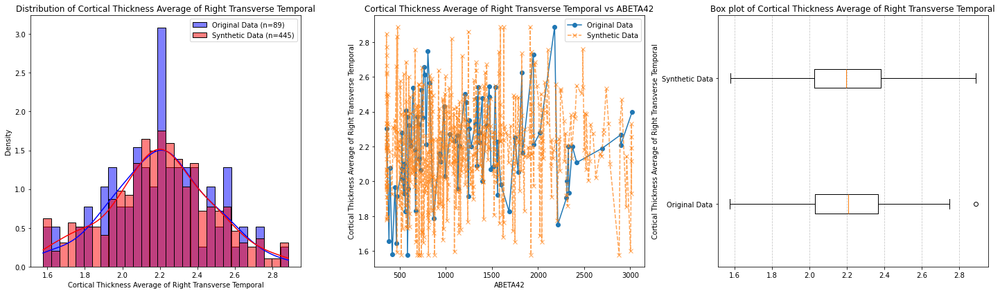

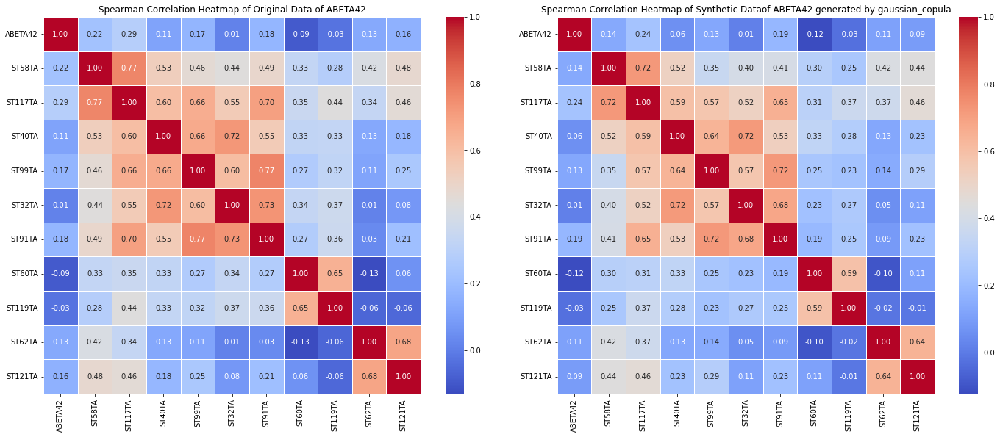

Mean absolute difference (MAD) of the correlation matrices: 0.03908261024360018
JS Divergence: 0.031020304235601762
Summary stats 0.006875000913362849
------------------------------------------------------------------------------------------------------------
Dependent variable: APVOLUME
Training with best parameters: {'correlation_method': 'pearson', 'covariance_regularization': 0.001260622844037793, 'marginal_distribution': 'auto', 'n_kde_points': 1000, 'tail_estimation_factor': 0.119840375227363}
Original data shape: (36, 11)
Synthetic data shape: (180, 11)


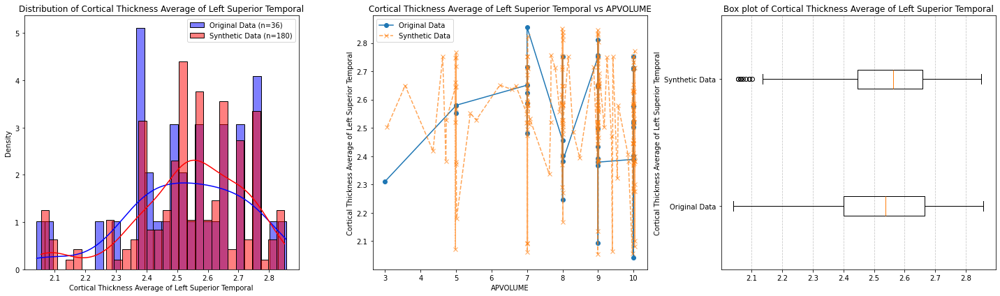

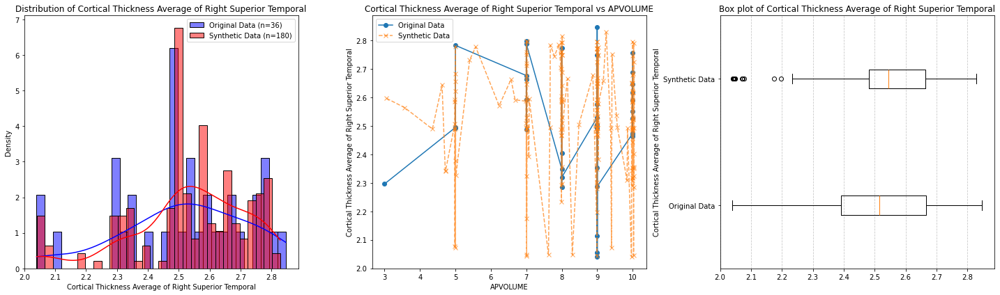

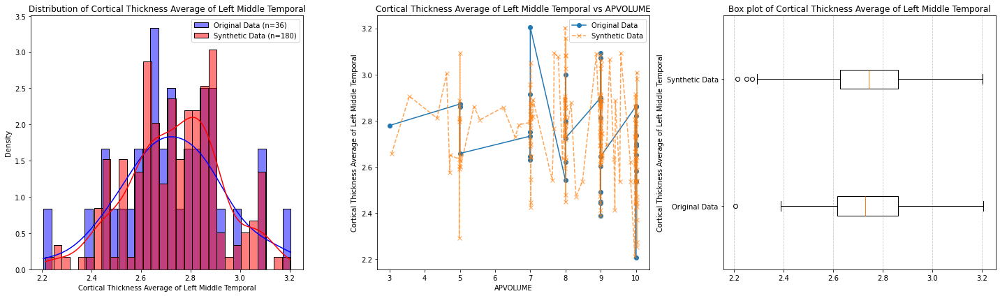

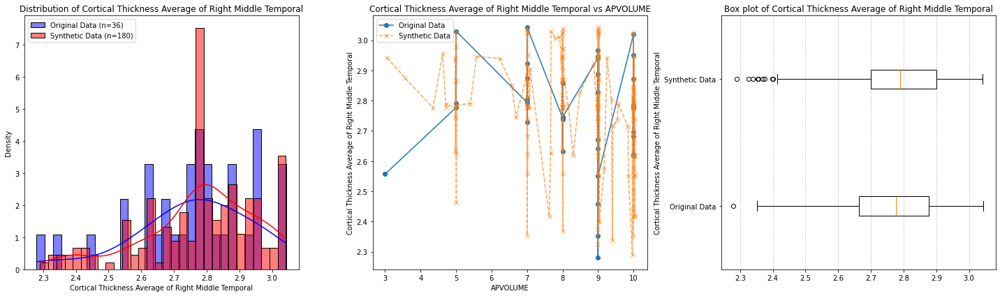

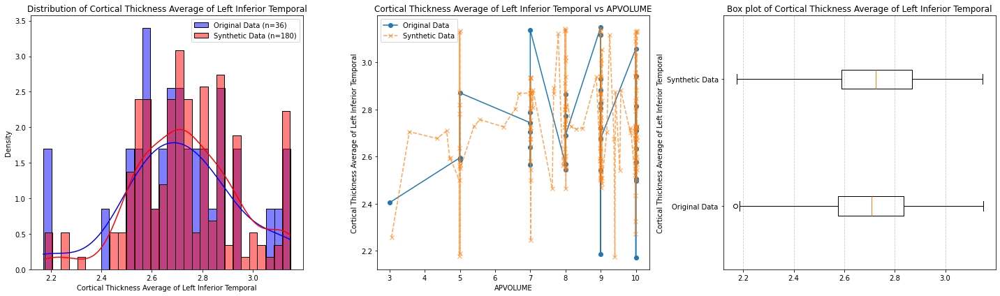

...

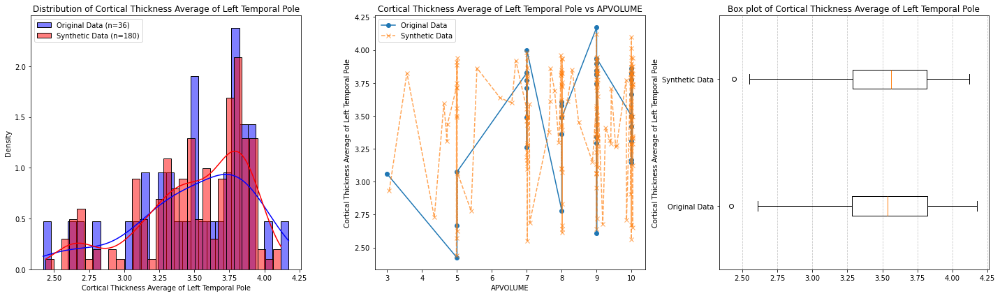

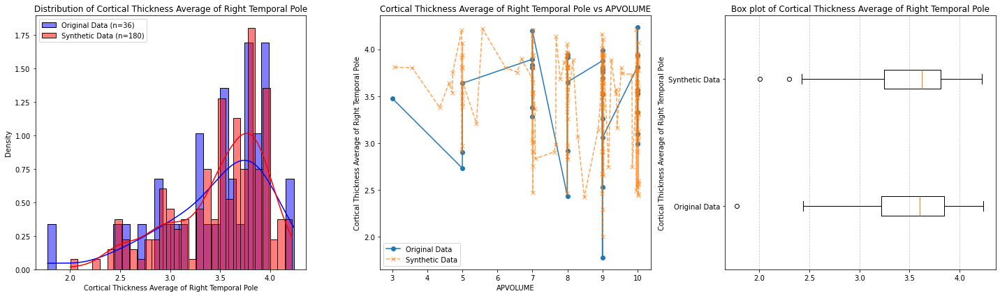

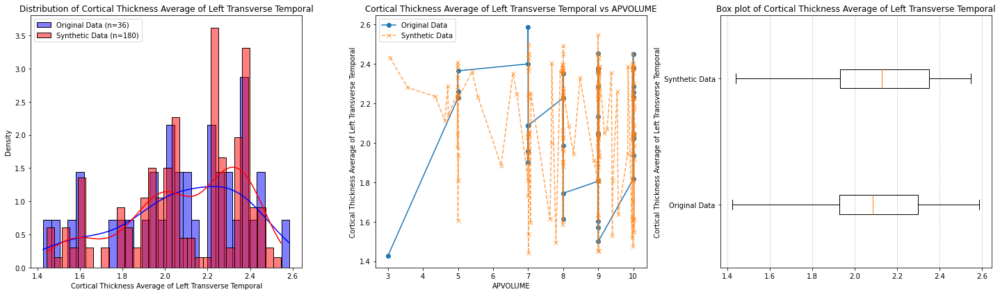

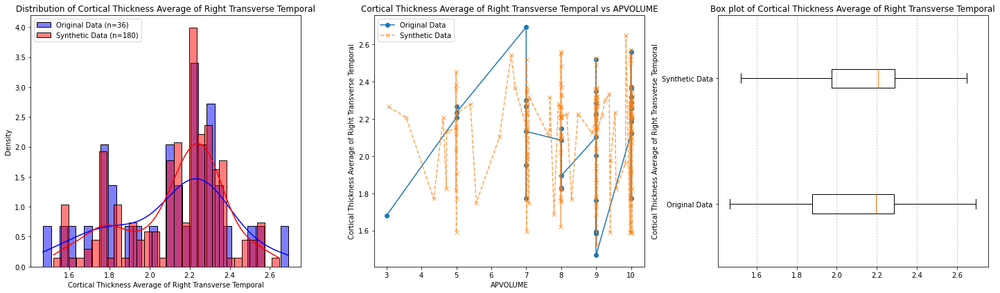

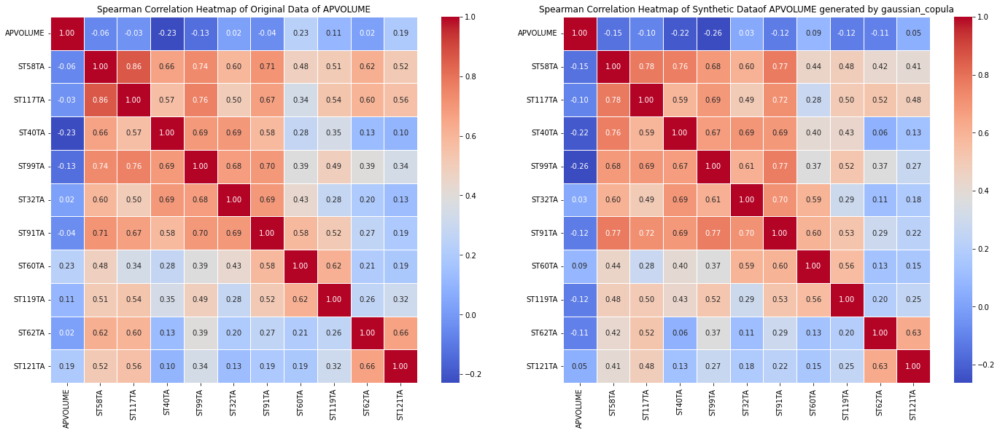

Mean absolute difference (MAD) of the correlation matrices: 0.05964438643070546
JS Divergence: 0.06689087829715668
Summary stats 0.009052239982578732
------------------------------------------------------------------------------------------------------------
Dependent variable: TAU
Training with best parameters: {'correlation_method': 'kendall', 'covariance_regularization': 0.0017292911903684554, 'marginal_distribution': 'kde', 'n_kde_points': 2000, 'tail_estimation_factor': 0.15207871312632393}
Original data shape: (89, 11)
Synthetic data shape: (445, 11)


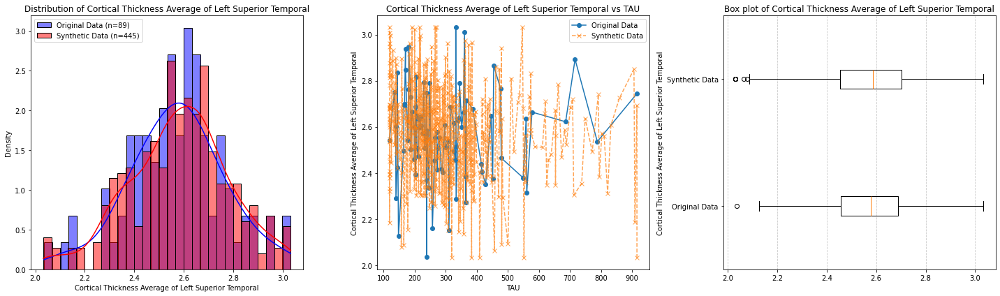

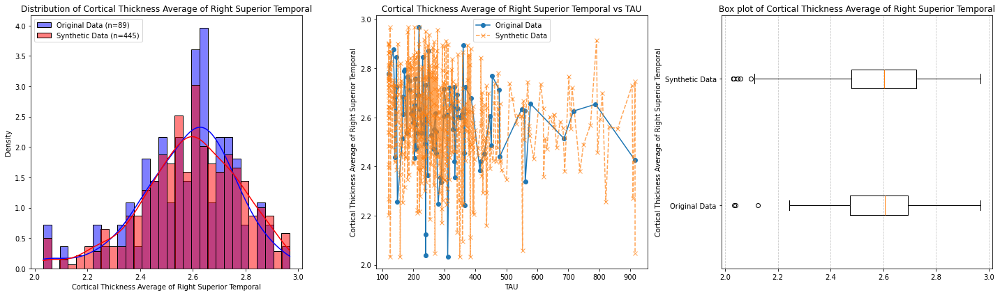

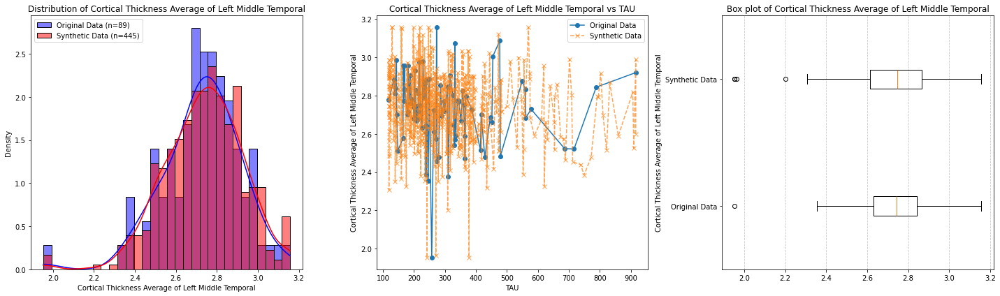

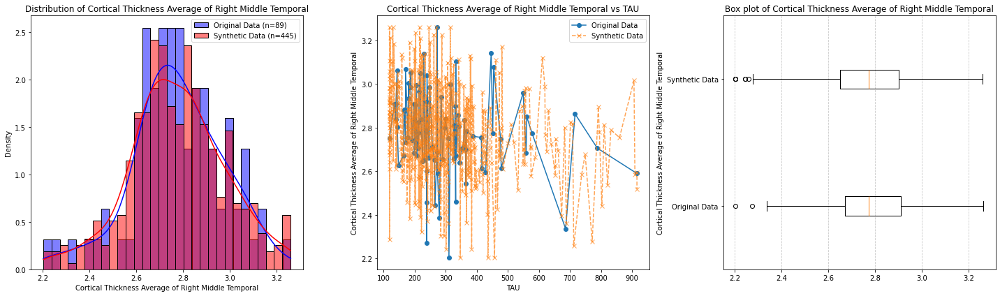

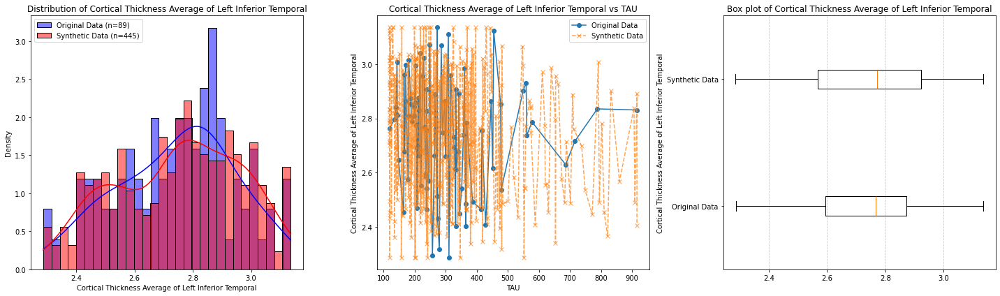

...

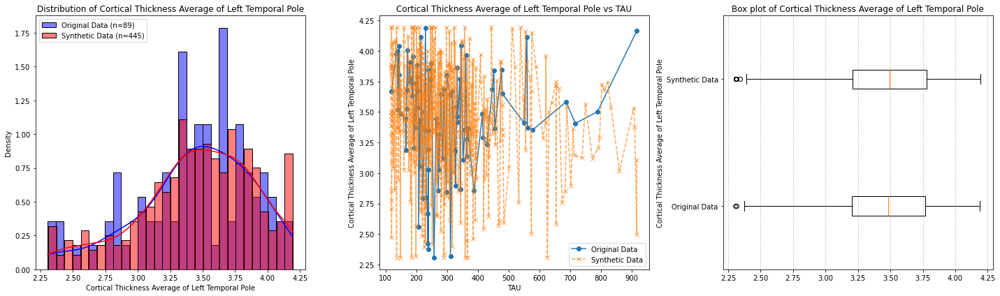

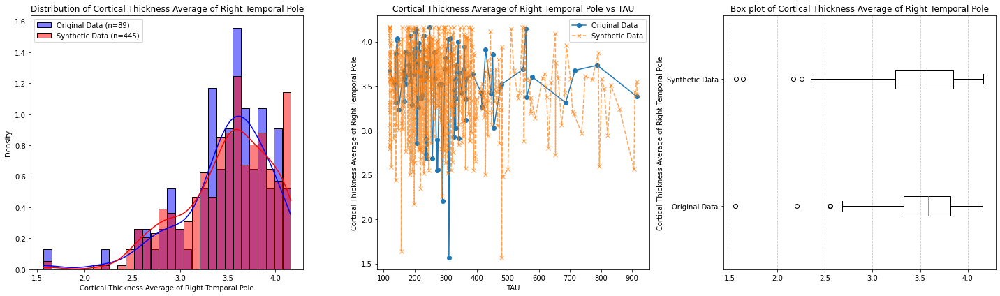

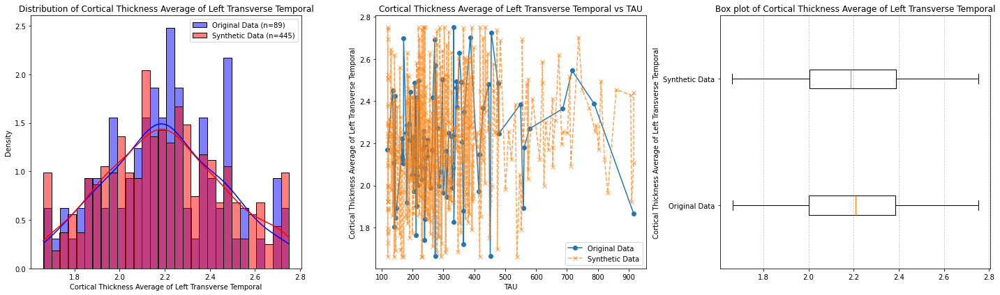

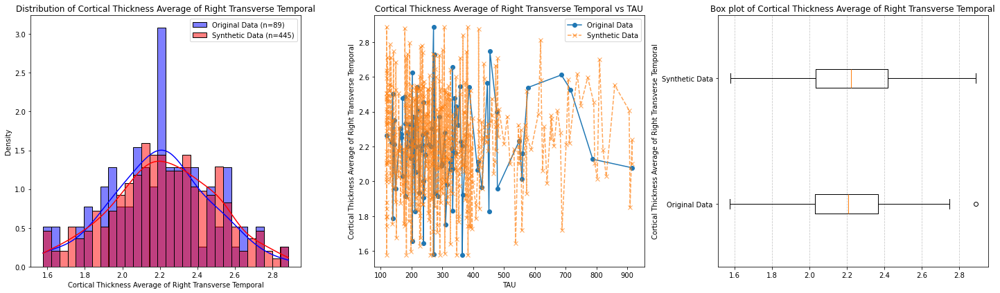

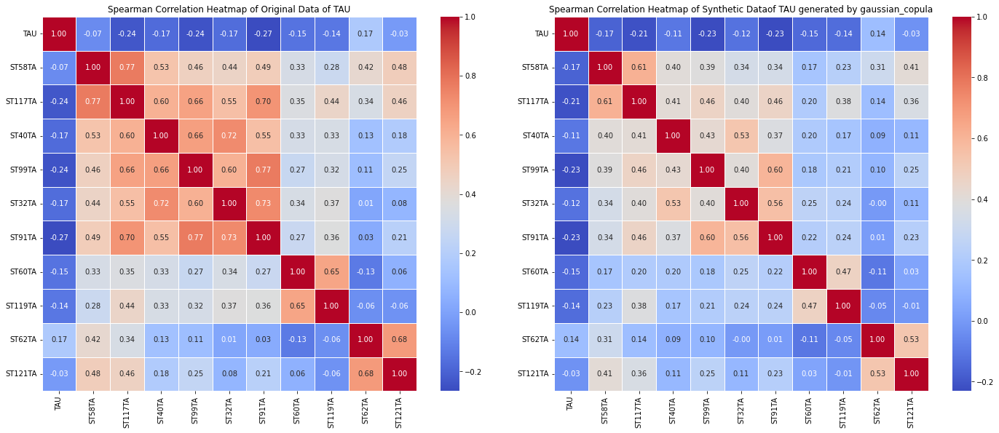

Mean absolute difference (MAD) of the correlation matrices: 0.0869308588272062
JS Divergence: 0.037389208192106144
Summary stats 0.008378023577570216
------------------------------------------------------------------------------------------------------------
Dependent variable: PTAU
Training with best parameters: {'correlation_method': 'pearson', 'covariance_regularization': 0.0033737171738406607, 'marginal_distribution': 'empirical', 'n_kde_points': 500, 'tail_estimation_factor': 0.16492314750400486}
Original data shape: (89, 11)
Synthetic data shape: (445, 11)


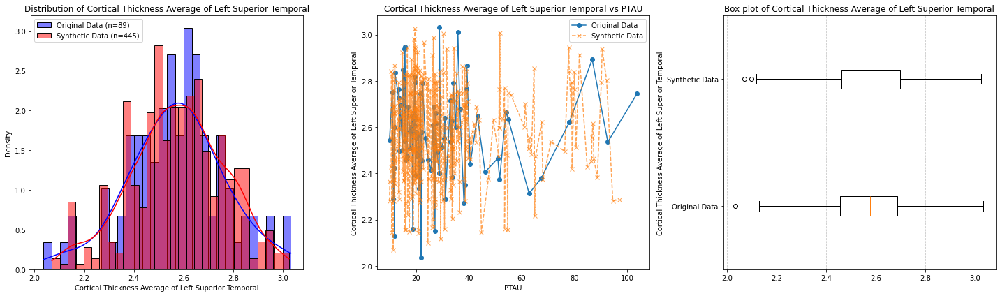

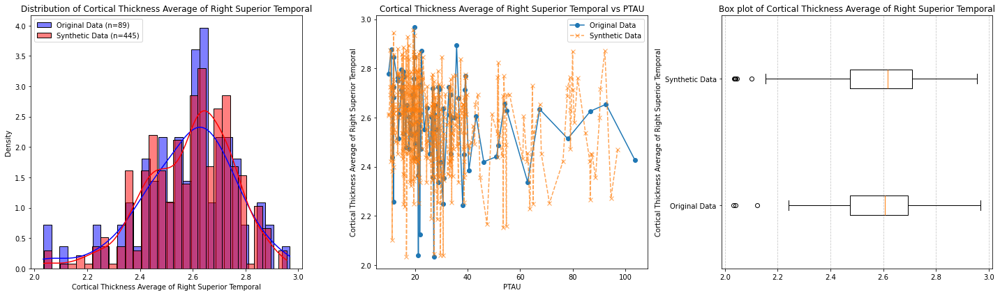

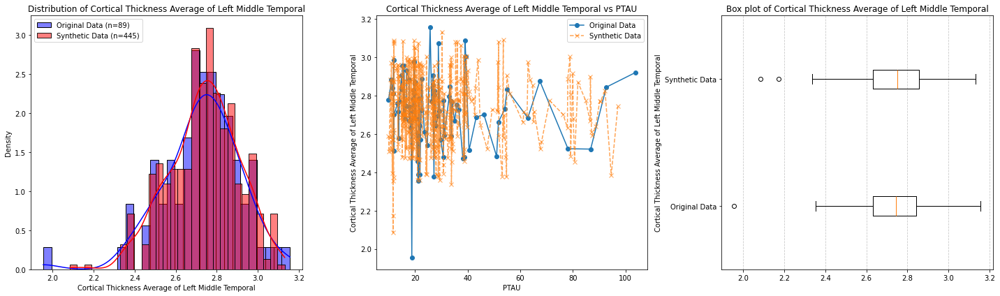

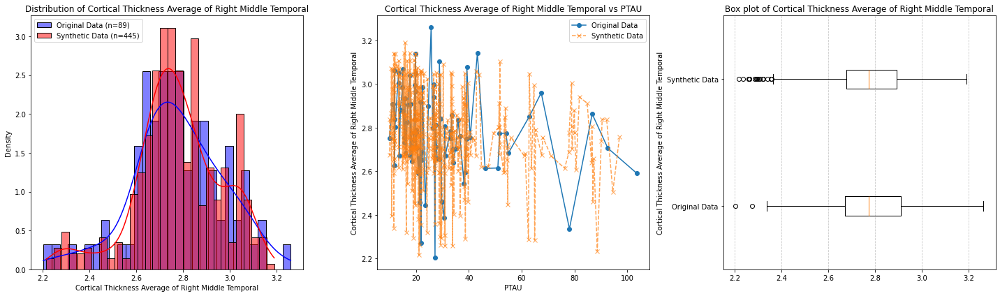

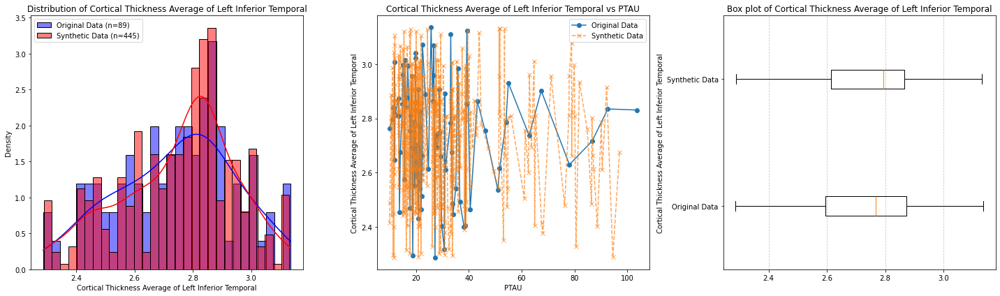

...

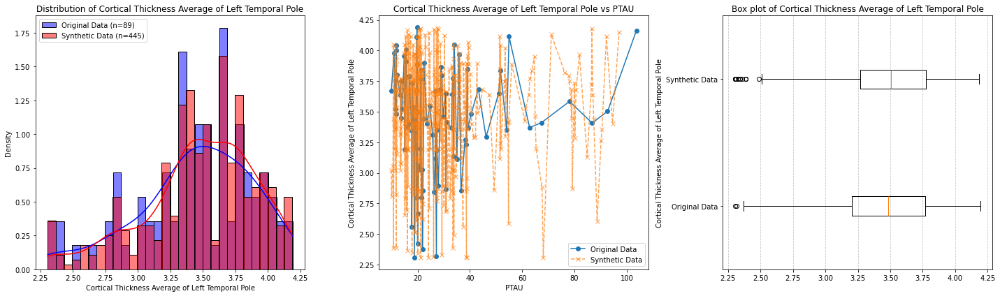

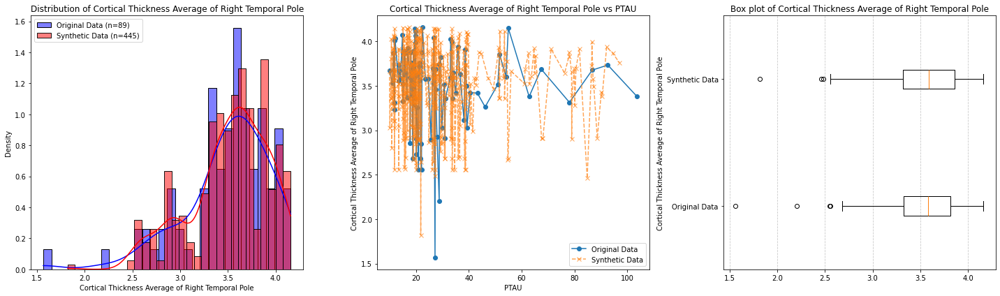

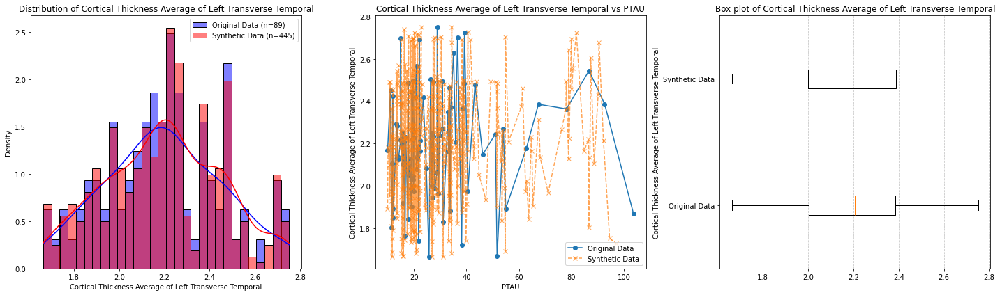

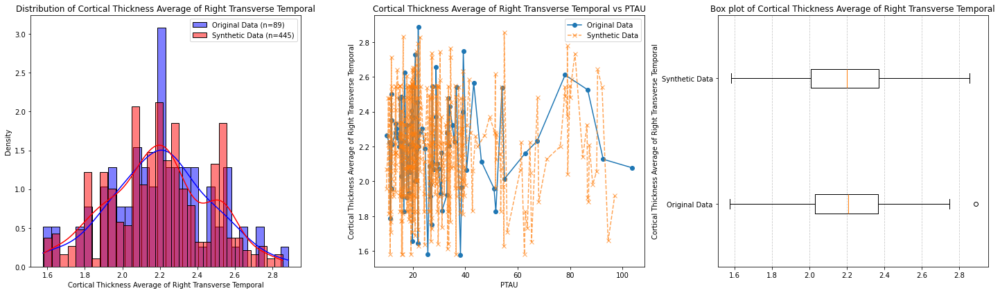

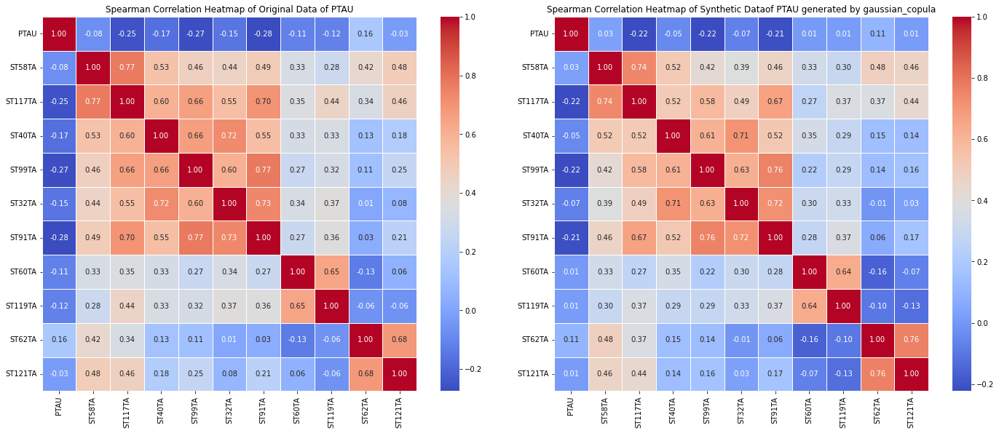

Mean absolute difference (MAD) of the correlation matrices: 0.04216521335499512
JS Divergence: 0.04799157814947559
Summary stats 0.006420506755937549
------------------------------------------------------------------------------------------------------------
Dependent variable: PLASMAPTAU181
Training with best parameters: {'correlation_method': 'pearson', 'covariance_regularization': 0.005412296585587082, 'marginal_distribution': 'kde', 'n_kde_points': 2000, 'tail_estimation_factor': 0.16575619915250359}
Original data shape: (733, 11)
Synthetic data shape: (3665, 11)


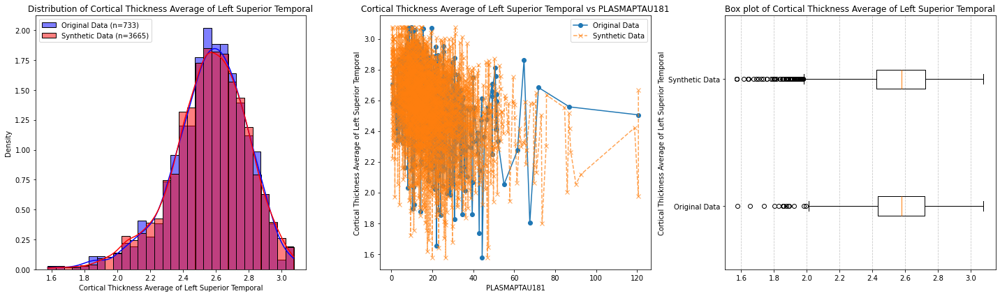

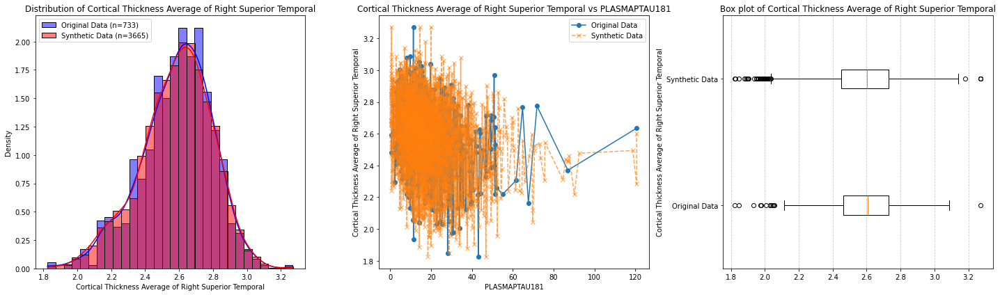

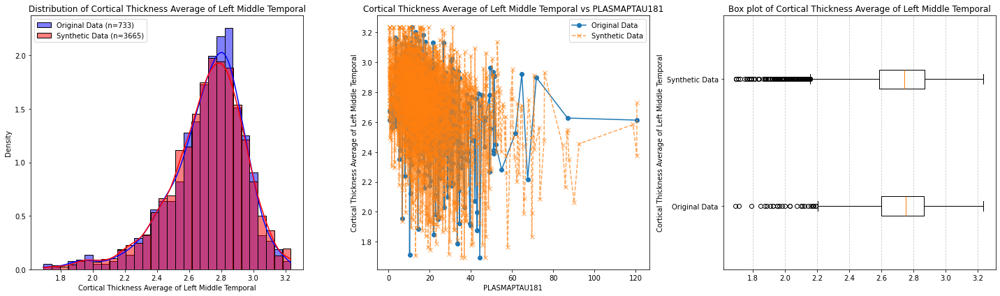

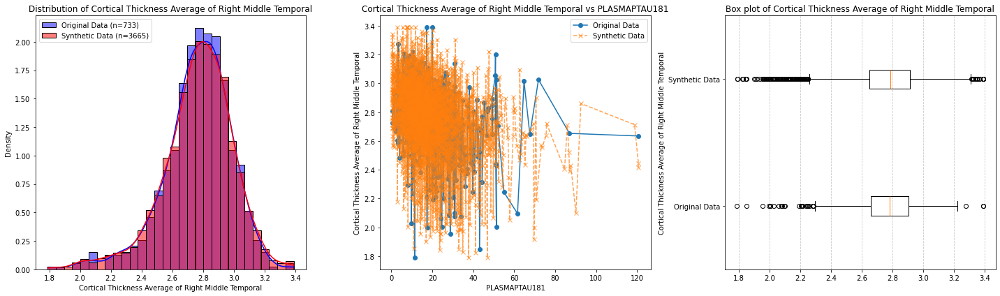

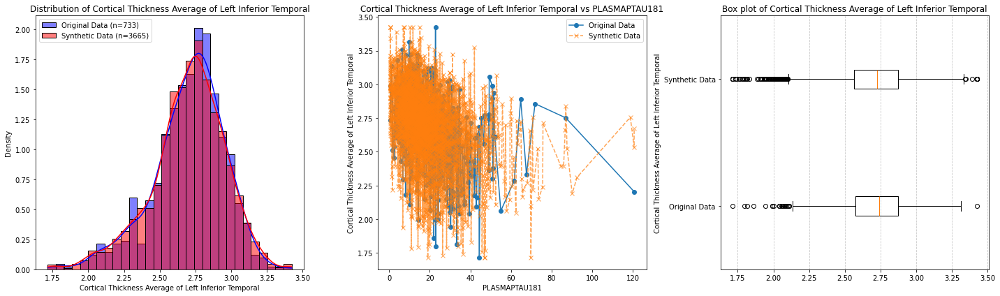

...

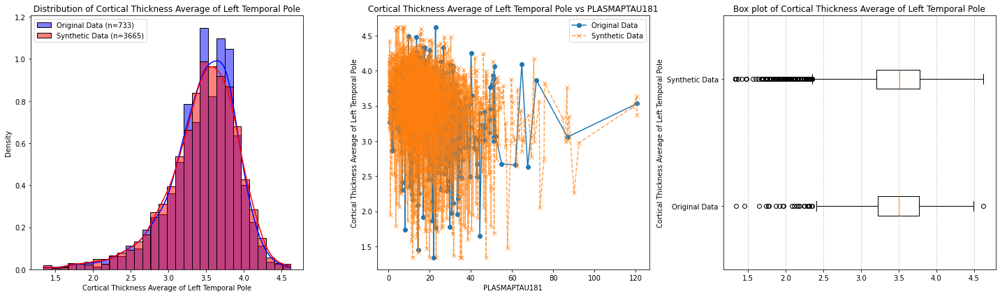

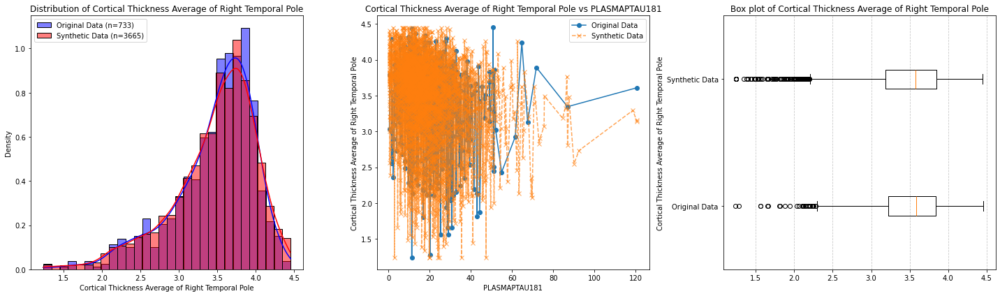

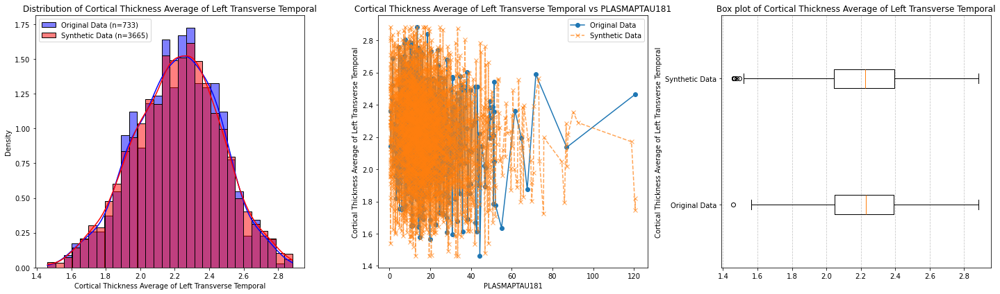

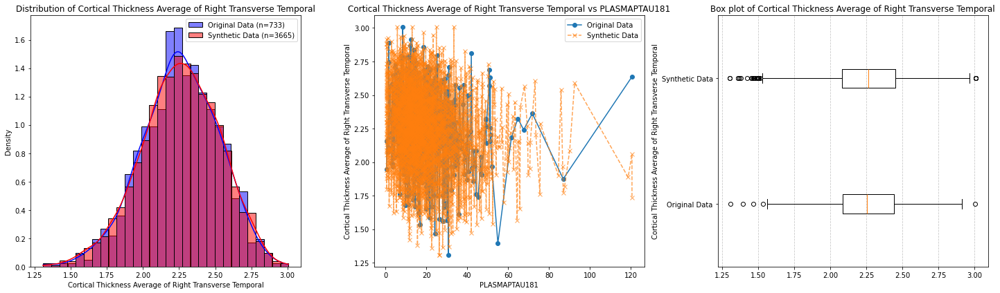

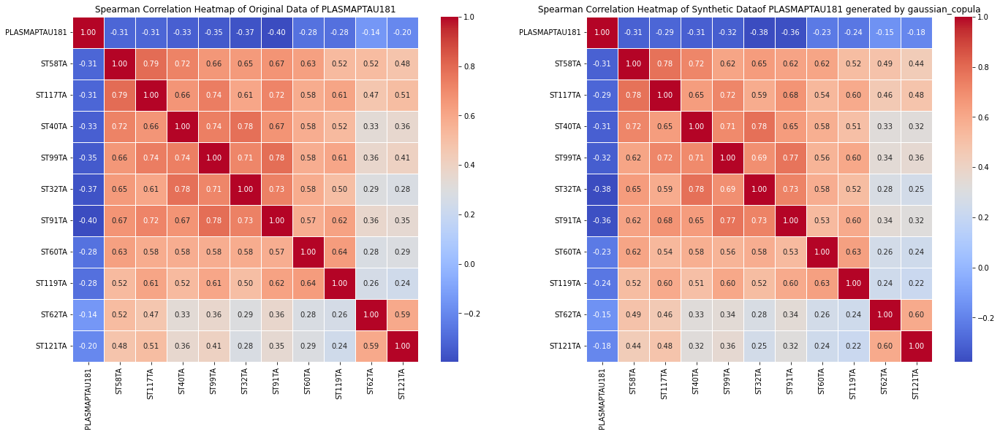

Mean absolute difference (MAD) of the correlation matrices: 0.018844195254751308
JS Divergence: 0.021154358119407773
Summary stats 0.003984110005299725
------------------------------------------------------------------------------------------------------------


In [264]:
# Gaussian Copula
# Using the best parameters to generate synthetic data from the original dataset

for dependent_variable in dependent_variables:
    print(f"Dependent variable: {dependent_variable}")

    # Filter the dataframe to get all the non-NaN values for the dependent variable and target variables
    filtered_df = filter_dataframe(dependent_variable)

    scalar = RobustScaler()
    scaled_data = scalar.fit_transform(filtered_df)
    scaled_df = pd.DataFrame(scaled_data, columns=filtered_df.columns)

    noise_factor = 0.005
    scaled_df += np.random.normal(0, noise_factor, scaled_df.shape)

    print(f"Training with best parameters: {best_params[dependent_variable]}")

    copula_model = GaussianCopula(**best_params[dependent_variable])

    copula_model.fit(scaled_df)

    n_samples = 5 * len(filtered_df)
    generated_synthetic_data = copula_model.sample(n_samples)

    # synthetic_data_dict["gaussian_copula"][dependent_variable] = pd.DataFrame(
    #     scalar.inverse_transform(generated_synthetic_data),
    #     columns=scaled_df.columns
    # )
    # synthetic_data = synthetic_data_dict["gaussian_copula"][dependent_variable]
    synthetic_data = pd.DataFrame(
        scalar.inverse_transform(generated_synthetic_data),
        columns=scaled_df.columns
    )

    print(f"Original data shape: {filtered_df.shape}")
    print(f"Synthetic data shape: {synthetic_data.shape}")

    synthetic_data = synthetic_data.sort_values(by=dependent_variable)
    filtered_df = filtered_df.sort_values(by=dependent_variable)

    for col in target_names:
    #     plot_histogram("gaussian_copula", filtered_df, synthetic_data, dependent_variable, col)

    #     plot_scatter("gaussian_copula", filtered_df, synthetic_data, dependent_variable, col)

    #     plot_boxplot("gaussian_copula", filtered_df, synthetic_data, dependent_variable, col)

    #     print("------------------------------------")
        save_histogram("gaussian_copula", filtered_df, synthetic_data, dependent_variable, col, display=False)
        save_scatter("gaussian_copula", filtered_df, synthetic_data, dependent_variable, col, display=False)
        save_boxplot("gaussian_copula", filtered_df, synthetic_data, dependent_variable, col, display=False)
        display_combined_visualizations("gaussian_copula", filtered_df, synthetic_data, dependent_variable, col)

    # plot_correlation_heatmap("gaussian_copula", filtered_df, synthetic_data, dependent_variable)
    save_correlation_heatmaps("gaussian_copula", filtered_df, synthetic_data, dependent_variable, display=False)
    display_combined_correlation_heatmap("gaussian_copula", filtered_df, synthetic_data, dependent_variable)
    model_metrics["gaussian_copula"][dependent_variable] = evaluate_model(filtered_df, synthetic_data)

    # synthetic_data_dict["gaussian_copula"][dependent_variable] = synthetic_data
    # original_data_dict[dependent_variable] = filtered_df

    print(f"------------------------------------------------------------------------------------------------------------")    

Gaussion Copula Metrics:
    ABETA42  APVOLUME       TAU      PTAU  PLASMAPTAU181
0  0.045277  0.062832  0.042551  0.037625       0.020675
1  0.042129  0.043501  0.101543  0.031749       0.155677
2  0.008442  0.010899  0.006354  0.004828       0.003259
CTGAN Metrics:
    ABETA42  APVOLUME       TAU      PTAU  PLASMAPTAU181
0  0.120984  0.136242  0.164090  0.122404       0.076730
1  0.121828  0.216619  0.321484  0.193912       0.092381
2  0.028309  0.025961  0.041481  0.023716       0.021585
1/error for Gaussian Copula: [0.04179200246723429, 0.07491992256749762, 0.006756291011276121]
error for CTGAN: [0.12409012403086184, 0.18924472608032672, 0.028210271548708955]
          metric            model       value
0            jsd  Gaussian Copula   23.928023
1           corr  Gaussian Copula   13.347585
2  summary_stats  Gaussian Copula  148.010202
3            jsd            CTGAN    8.058659
4           corr            CTGAN    5.284163
5  summary_stats            CTGAN   35.448081


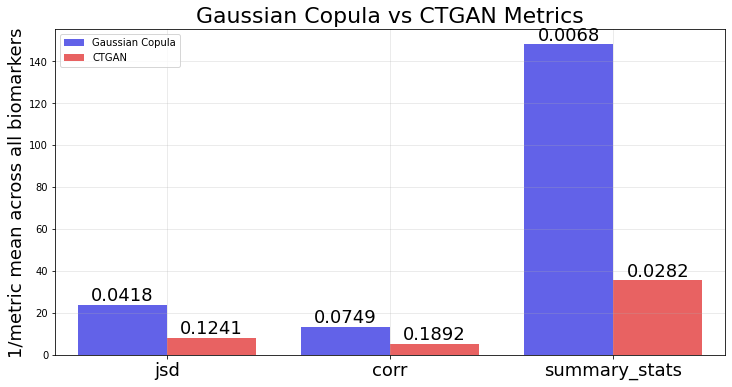

In [ ]:
# Change it to the actual metrics 
gs = model_metrics["gaussian_copula"]
ct = model_metrics["ctgan"]
# gs = pd.read_csv("./metrics/gaussian_copula/gaussian_copula_metrics copy.csv")
# ct = pd.read_csv("./metrics/ctgan/ctgan_metrics copy.csv")
# dependent_variables = ["ABETA42", "TAU", "PTAU", "APVOLUME", "PLASMAPTAU181"]

gs.drop(columns=["Metric"], inplace=True)
ct.drop(columns=["Metric"], inplace=True)
print(f"Gaussion Copula Metrics:\n{gs}")
print(f"CTGAN Metrics:\n{ct}")

# x = ["jensen_shannon_divergence", "correlation_diff", "summary_stats"]
x = ["jsd", "corr", "summary_stats"]
y_gs = [1/gs.iloc[0].mean(), 1/gs.iloc[1].mean(), 1/gs.iloc[2].mean()]
y_ct = [1/ct.iloc[0].mean(), 1/ct.iloc[1].mean(), 1/ct.iloc[2].mean()]
print(f"1/error for Gaussian Copula: {[gs.iloc[0].mean(), gs.iloc[1].mean(), gs.iloc[2].mean()]}")
print(f"error for CTGAN: {[ct.iloc[0].mean(), ct.iloc[1].mean(), ct.iloc[2].mean()]}")

# Reshape data for seaborn
data = {
    'metric': x * 2,
    'model': ['Gaussian Copula'] * 3 + ['CTGAN'] * 3,
    'value': y_gs + y_ct
}
df = pd.DataFrame(data)
print(df)

# Create plot

plt.figure(figsize=(12, 6))
ax = sns.barplot(x='metric', y='value', hue='model', data=df, 
           palette={'Gaussian Copula': 'blue', 'CTGAN': 'red'}, alpha=0.7)

# Add value labels
for i, p in enumerate(ax.patches):
    height = p.get_height()
    original_value = 1/height if height != 0 else float('inf')
    ax.text(p.get_x() + p.get_width()/2., height + 2,
            f'{original_value:.4f}' if height!=0 else "", ha='center', fontsize=18)
    ax.tick_params(axis='x', labelsize=18)
    # ax.tick_params(axis='y', labelsize=18)

# plt.xlabel('Metrics', fontsize=12)
plt.xlabel('', fontsize=12)
plt.ylabel('1/metric mean across all biomarkers', fontsize=18)
plt.title('Gaussian Copula vs CTGAN Metrics', fontsize=22)
plt.grid(True, alpha=0.3)
plt.legend()
plt.grid(True, alpha=0.3)
plt.savefig("avg_metrics.png")
plt.show()

          metric            model       value
0            jsd  Gaussian Copula   22.086236
1           corr  Gaussian Copula   23.736449
2  summary_stats  Gaussian Copula  118.452998
3            jsd            CTGAN    8.265562
4           corr            CTGAN    8.208318
5  summary_stats            CTGAN   35.324952
          metric            model       value
0            jsd  Gaussian Copula   23.500947
1           corr  Gaussian Copula    9.848085
2  summary_stats  Gaussian Copula  157.378400
3            jsd            CTGAN    6.094206
4           corr            CTGAN    3.110579
5  summary_stats            CTGAN   24.107264
          metric            model       value
0            jsd  Gaussian Copula   26.578288
1           corr  Gaussian Copula   31.496588
2  summary_stats  Gaussian Copula  207.143580
3            jsd            CTGAN    8.169669
4           corr            CTGAN    5.156967
5  summary_stats            CTGAN   42.165432
          metric            model 

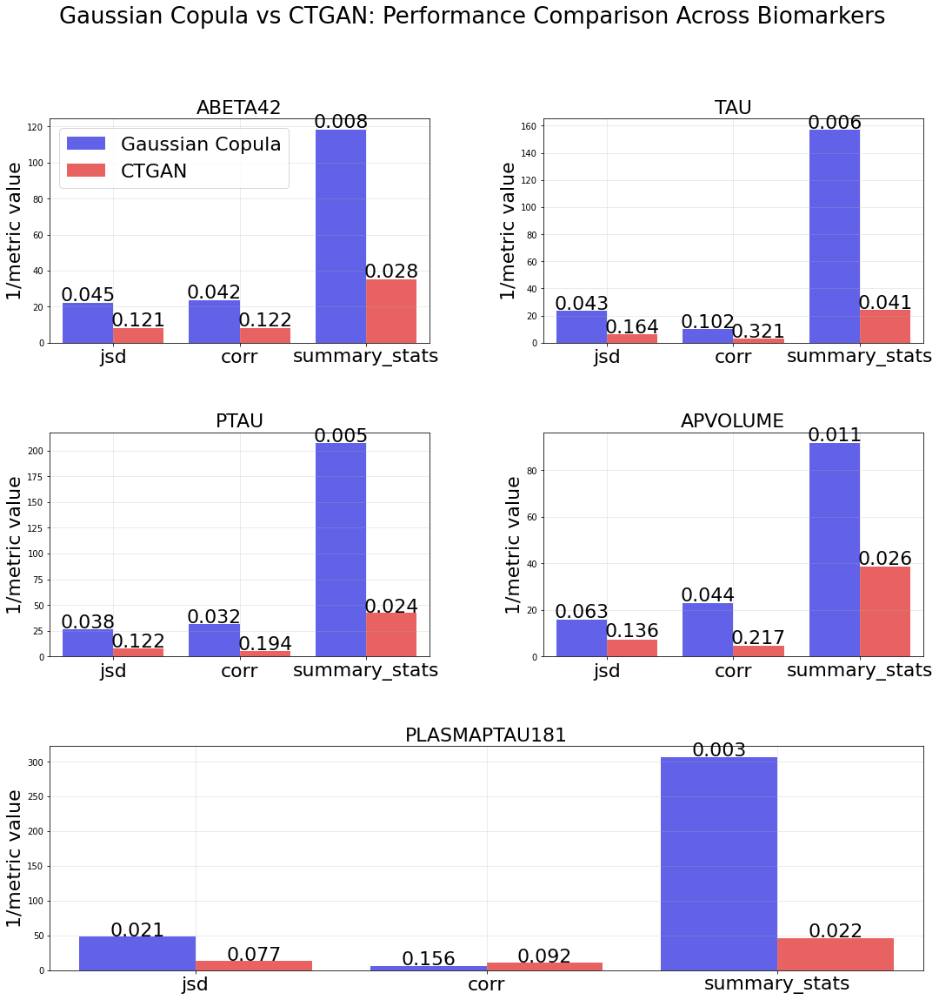

In [87]:
# Alternative layout: Custom grid with the last plot centered
plt.figure(figsize=(18, 18))

# Create a GridSpec layout
grid_spec = plt.GridSpec(3, 2, width_ratios=[1, 1], height_ratios=[1, 1, 1], 
                 wspace=0.3, hspace=0.4)

# Create the first 4 subplots (2 per row)
for i in range(4):
    row = i // 2
    col = i % 2
    
    # Get the current biomarker
    biomarker = dependent_variables[i]
    
    # Extract values for this biomarker
    y_gs = [1/gs.iloc[0][biomarker], 1/gs.iloc[1][biomarker], 1/gs.iloc[2][biomarker]]
    y_ct = [1/ct.iloc[0][biomarker], 1/ct.iloc[1][biomarker], 1/ct.iloc[2][biomarker]]
    
    # Reshape data for seaborn
    data = {
        'metric': x * 2,
        'model': ['Gaussian Copula'] * 3 + ['CTGAN'] * 3,
        'value': y_gs + y_ct
    }
    df = pd.DataFrame(data)
    print(df)
    
    # Create subplot
    ax = plt.subplot(grid_spec[row, col])
    sns.barplot(x='metric', y='value', hue='model', data=df, 
               palette={'Gaussian Copula': 'blue', 'CTGAN': 'red'}, alpha=0.7, ax=ax)
    # increase the font size of the ticks
    ax.tick_params(axis='x', labelsize=22)
    
    # Add value labels
    for j, p in enumerate(ax.patches):
        height = p.get_height()
        original_value = 1/height if height != 0 else float('inf')
        ax.text(p.get_x() + p.get_width()/2., height + 1,
                f'{original_value:.3f}' if height!=0 else "", ha='center', fontsize=22)
    
    # ax.set_xlabel('Metrics', fontsize=14)
    ax.set_xlabel('', fontsize=14)
    ax.set_ylabel('1/metric value', fontsize=22)
    ax.set_title(f'{biomarker}', fontsize=22)
    ax.grid(True, alpha=0.3)
    
    # Only show legend on the first subplot
    if i == 0:
        ax.legend(title='', fontsize=22)
    else:
        ax.legend([],[], frameon=False)

# Create the last subplot (centered in the bottom row)
biomarker = dependent_variables[4]
y_gs = [1/gs.iloc[0][biomarker], 1/gs.iloc[1][biomarker], 1/gs.iloc[2][biomarker]]
y_ct = [1/ct.iloc[0][biomarker], 1/ct.iloc[1][biomarker], 1/ct.iloc[2][biomarker]]

data = {
    'metric': x * 2,
    'model': ['Gaussian Copula'] * 3 + ['CTGAN'] * 3,
    'value': y_gs + y_ct
}
df = pd.DataFrame(data)

# Create the last subplot centered at the bottom
ax = plt.subplot(grid_spec[2, :])
sns.barplot(x='metric', y='value', hue='model', data=df, 
           palette={'Gaussian Copula': 'blue', 'CTGAN': 'red'}, alpha=0.7, ax=ax)
ax.tick_params(axis='x', labelsize=22)

# Add value labels
for j, p in enumerate(ax.patches):
    height = p.get_height()
    original_value = 1/height if height != 0 else float('inf')
    ax.text(p.get_x() + p.get_width()/2., height + 1,
            f'{original_value:.3f}' if height!=0 else "", ha='center', fontsize=22)
    # ax.tick_params(axis='x', labelsize=15)
    # ax.tick_params(axis='y', labelsize=16)

# ax.set_xlabel('Metrics', fontsize=14)
ax.set_xlabel('', fontsize=14)
ax.set_ylabel('1/metric value', fontsize=22)
ax.set_title(f'{biomarker}', fontsize=22)
ax.grid(True, alpha=0.3)
ax.legend([],[], frameon=False)

# Add an overall title
plt.suptitle('Gaussian Copula vs CTGAN: Performance Comparison Across Biomarkers', fontsize=26, y=0.98)

# Adjust layout
# plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig('biomarker_subplots_centered.png', dpi=300)
plt.show()

In [265]:
model_metrics["gaussian_copula"]

{'ABETA42': {'correlation_diff': 0.03908261024360018,
  'jensen_shannon_divergence': 0.031020304235601762,
  'summary_stats': 0.006875000913362849},
 'APVOLUME': {'correlation_diff': 0.05964438643070546,
  'jensen_shannon_divergence': 0.06689087829715668,
  'summary_stats': 0.009052239982578732},
 'TAU': {'correlation_diff': 0.0869308588272062,
  'jensen_shannon_divergence': 0.037389208192106144,
  'summary_stats': 0.008378023577570216},
 'PTAU': {'correlation_diff': 0.04216521335499512,
  'jensen_shannon_divergence': 0.04799157814947559,
  'summary_stats': 0.006420506755937549},
 'PLASMAPTAU181': {'correlation_diff': 0.018844195254751308,
  'jensen_shannon_divergence': 0.021154358119407773,
  'summary_stats': 0.003984110005299725}}

In [90]:
best_params

{'ABETA42': {'correlation_method': 'kendall',
  'covariance_regularization': 0.05421603087322526,
  'marginal_distribution': 'empirical',
  'n_kde_points': 2000,
  'tail_estimation_factor': 0.09949878845664599},
 'APVOLUME': {'correlation_method': 'pearson',
  'covariance_regularization': 0.019779099524208716,
  'marginal_distribution': 'auto',
  'n_kde_points': 500,
  'tail_estimation_factor': 0.09900923721663822},
 'TAU': {'correlation_method': 'pearson',
  'covariance_regularization': 0.004138347891767784,
  'marginal_distribution': 'kde',
  'n_kde_points': 1000,
  'tail_estimation_factor': 0.19592275674300288},
 'PTAU': {'correlation_method': 'spearman',
  'covariance_regularization': 0.00262290642134806,
  'marginal_distribution': 'kde',
  'n_kde_points': 500,
  'tail_estimation_factor': 0.13307443676232367},
 'PLASMAPTAU181': {'correlation_method': 'pearson',
  'covariance_regularization': 0.013596228164703043,
  'marginal_distribution': 'auto',
  'n_kde_points': 5000,
  'tail_es

In [67]:
save_hyperparameters_as_csv(best_params, dependent_variables, "gaussian_copula")
save_metrics_as_csv(model_metrics["gaussian_copula"], dependent_variables, "gaussian_copula")

CSV file './hyperparameters/gaussian_copula/gaussian_copula_hyperparams.csv' generated successfully.
CSV file './metrics/gaussian_copula/gaussian_copula_metrics.csv' generated successfully.
